In [1]:
!pip install geopandas matplotlib plotly

In [2]:
!pip install pygam ace_tools

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 16.2 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1


In [3]:
pip install --upgrade patsy statsmodels


In [4]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Concatenate
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go

In [5]:
weather_data = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/complete_KNN_dataset_corrected.csv')
topo_features = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/topological_features_365d_gpus.csv')
soil_data= pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/table_static_data_selected.csv')

yield_soil = pd.read_csv('/content/drive/MyDrive/yield_classification/corn2001_2023_yield_data.csv')
yield_data = yield_soil[['Year', 'County', 'Value']]

# yield_data = yield_data[~((yield_data['Year'] == 2012) & (yield_data['Value'] < 90))]
yield_data = yield_data[~(yield_data['County'] =='OTHER (COMBINED) COUNTIES')]
yield_data= yield_data.rename(columns={'County': 'county'})
soil_data = soil_data.rename(columns={'NAME_U': 'county'})
soil_data = soil_data[['county', 'aws0_5', 'aws5_20',
       'aws20_50', 'aws0_20', 'soc0_20', 'soc0_30',
       'nccpi3corn', 'slope_r', 'elev_r',
        'W_avg_silt', 'W_avg_clay']]
yield_data = yield_data.rename(columns={'Year': 'year'})
weather_data = weather_data.rename(columns={'Date': 'date'})
topo_features = topo_features.rename(columns={'County': 'county'})

In [ ]:
yield_data.head()

,year,county,Value
0,2023,OTHER COUNTIES,202.5
1,2023,BARTHOLOMEW,195.0
2,2023,BOONE,207.2
3,2023,CLINTON,234.4
4,2023,DECATUR,221.9


In [ ]:
weather_data.head()

,date,county,mergedmax_temp,mergedmean_temp,mergedmin_temp,merged_precip,gdd
0,2001-01-01,ADAMS,29.0,19.5,10.0,0.000,0.0
1,2001-01-02,ADAMS,24.0,17.0,10.0,0.010,0.0
2,2001-01-03,ADAMS,24.0,15.5,7.0,0.000,0.0
3,2001-01-04,ADAMS,29.0,24.5,20.0,0.005,0.0
4,2001-01-05,ADAMS,35.0,30.5,26.0,0.000,0.0


In [ ]:
topo_features .head()

,county,year,BirthMean_0,DeathMean_0,LifeMean_0,NumBar_0,BirthMean_1,DeathMean_1,LifeMean_1,NumBar_1,DistQ0,DistQ1,DistQ2,DistQ3,DistQ4,CosSimQ0,CosSimQ1,CosSimQ2,CosSimQ3,CosSimQ4
0,ADAMS,2001,0.0,1.0,1.0,3,0.0,1.0,1.0,7634,0.0,0.266328,0.500183,0.803705,1.855520,0.0,0.965423,0.989318,0.996962,1.0
1,ADAMS,2002,0.0,1.0,1.0,10,0.0,1.0,1.0,7842,0.0,0.265844,0.517614,0.816367,1.830613,0.0,0.966523,0.991715,0.998095,1.0
2,ADAMS,2005,0.0,1.0,1.0,7,0.0,1.0,1.0,8069,0.0,0.250802,0.490791,0.796564,1.717780,0.0,0.975132,0.993333,0.998537,1.0
3,ADAMS,2006,0.0,1.0,1.0,3,0.0,1.0,1.0,9320,0.0,0.232436,0.425260,0.678850,1.724996,0.0,0.981186,0.993118,0.998070,1.0
4,ADAMS,2007,0.0,1.0,1.0,3,0.0,1.0,1.0,10067,0.0,0.214379,0.450874,0.746337,1.741927,0.0,0.986038,0.995427,0.999048,1.0


In [ ]:
soil_data.head()

,county,aws0_5,aws5_20,aws20_50,aws0_20,soc0_20,soc0_30,nccpi3corn,slope_r,elev_r,W_avg_silt,W_avg_clay
0,STEUBEN,19.33,58.000000,115.129997,77.339996,23997,35881,0.039,0.0,266.0,4.034483,1.729064
1,LAGRANGE,18.90,56.700001,112.809998,75.599998,23757,35599,0.240,1.0,275.0,4.034483,1.729064
2,ELKHART,6.90,20.719999,43.650002,27.639999,3127,3707,0.653,1.0,237.0,9.699507,4.453202
3,ST JOSEPH,4.91,14.729999,28.850000,19.639999,1977,2418,0.518,8.0,242.0,4.290640,3.719212
4,LAKE,9.01,27.030001,45.279999,36.040001,4274,5122,0.571,4.0,230.0,53.625000,33.335526


In [ ]:
def gam_analysis_pygam(X_df, y_df):
    """
    Perform Generalized Additive Model (GAM) analysis using pygam.

    Parameters:
    X_df (pd.DataFrame): DataFrame containing input features.
    y_df (pd.DataFrame): DataFrame containing the target variable.

    Returns:
    LinearGAM: The trained GAM model.
    """
    # Validate inputs
    if not isinstance(X_df, pd.DataFrame) or not isinstance(y_df, pd.DataFrame):
        raise ValueError("X_df and y_df must be pandas DataFrames.")
    if len(y_df.columns) != 1:
        raise ValueError("y_df must have exactly one column (the target variable).")

    # Extract feature names and target
    feature_names = X_df.columns
    target_name = y_df.columns[0]

    # Combine all terms into a TermList
    terms = s(0)
    for i in range(1, X_df.shape[1]):
        terms += s(i)  # Add spline terms for all features

    # Initialize GAM with combined terms
    gam = LinearGAM(terms)

    # Fit the GAM to the data
    gam.fit(X_df.values, y_df.values.flatten())

    # Print model summary
    print("GAM Model Summary:")
    print(gam.summary())

    # Visualize smooth effects for each feature
    for i, feature in enumerate(feature_names):
        plt.figure(figsize=(8, 6))
        XX = gam.generate_X_grid(term=i)  # Generate grid for the specific term

        # Partial dependence and confidence intervals
        pd_mean = gam.partial_dependence(term=i, X=XX)
        pd_bounds = gam.partial_dependence(term=i, X=XX, width=0.95)

        # Debugging: Check shapes
        print(f"Feature: {feature}")
        print(f"XX[:, i] shape: {XX[:, i].shape}")
        print(f"pd_mean shape: {pd_mean.shape}")
        print(f"pd_bounds[0] shape: {pd_bounds[0].shape}")
        print(f"pd_bounds[1] shape: {pd_bounds[1].shape}")

        # Extract lower and upper bounds
        pd_lower = pd_bounds[0]
        pd_upper = pd_bounds[1]

        # Ensure shapes match
        if pd_lower.shape != XX[:, i].shape:
            print("Shape mismatch detected: Truncating pd_lower and pd_upper.")
            pd_lower = pd_lower[:XX[:, i].shape[0]]
            pd_upper = pd_upper[:XX[:, i].shape[0]]

        # Plot partial dependence
        plt.plot(XX[:, i], pd_mean, label=f'Smooth effect of {feature}')
        plt.fill_between(
            XX[:, i],
            pd_lower,
            pd_upper,
            alpha=0.2,
            label="95% Confidence Interval"
        )
        plt.title(f'Smooth Effect of {feature}')
        plt.xlabel(feature)
        plt.ylabel("Partial Dependence")
        plt.legend()
        plt.show()

    return gam


Running GAM Analysis on Soil Data...
GAM Model Summary:
LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     66.8401
Link Function:                     IdentityLink Log Likelihood:                                -14475.8576
Number of Samples:                         1901 AIC:                                            29087.3954
                                                AICc:                                           29092.4933
                                                GCV:                                              863.0659
                                                Scale:                                            808.6203
                                                Pseudo R-Squared:                       

<ipython-input-64-9cb42da78328>:35: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


ValueError: 'y2' is not 1-dimensional

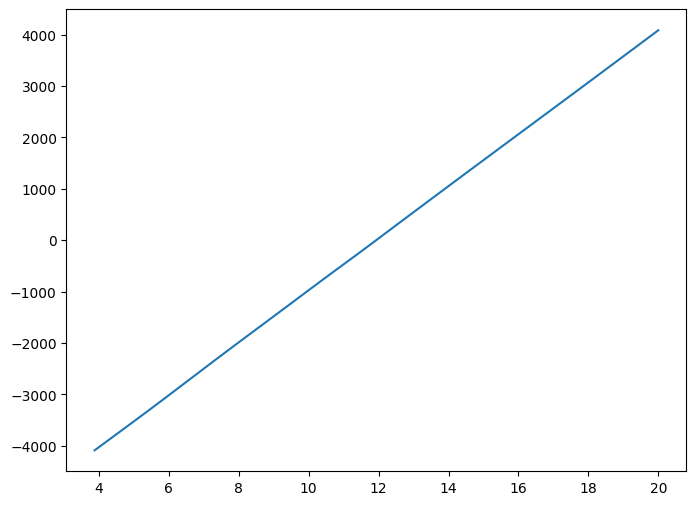

In [ ]:

# Merge Soil Data with Yield Data
soil_data_merged = pd.merge(yield_data, soil_data, on='county', how='inner')

# Merge Topo Data with Yield Data
topo_data_merged = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Prepare Soil Data
soil_features = soil_data_merged.drop(columns=['county', 'year', 'Value'])
soil_target = soil_data_merged[['Value']]

# Prepare Topo Data
topo_features = topo_data_merged.drop(columns=['county', 'year', 'Value'])
topo_target = topo_data_merged[['Value']]


# Run GAM Analysis on Soil Data
print("Running GAM Analysis on Soil Data...")
gam_soil = gam_analysis_pygam(soil_features, soil_target)

# Run GAM Analysis on Topo Data
print("Running GAM Analysis on Topo Data...")
gam_topo = gam_analysis_pygam(topo_features, topo_target)


<ipython-input-6-b4d2b6209139>:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  avg_rainfall_per_county = df_merged.groupby('county').apply(lambda x: x.groupby('year')['merged_precip'].sum().mean())


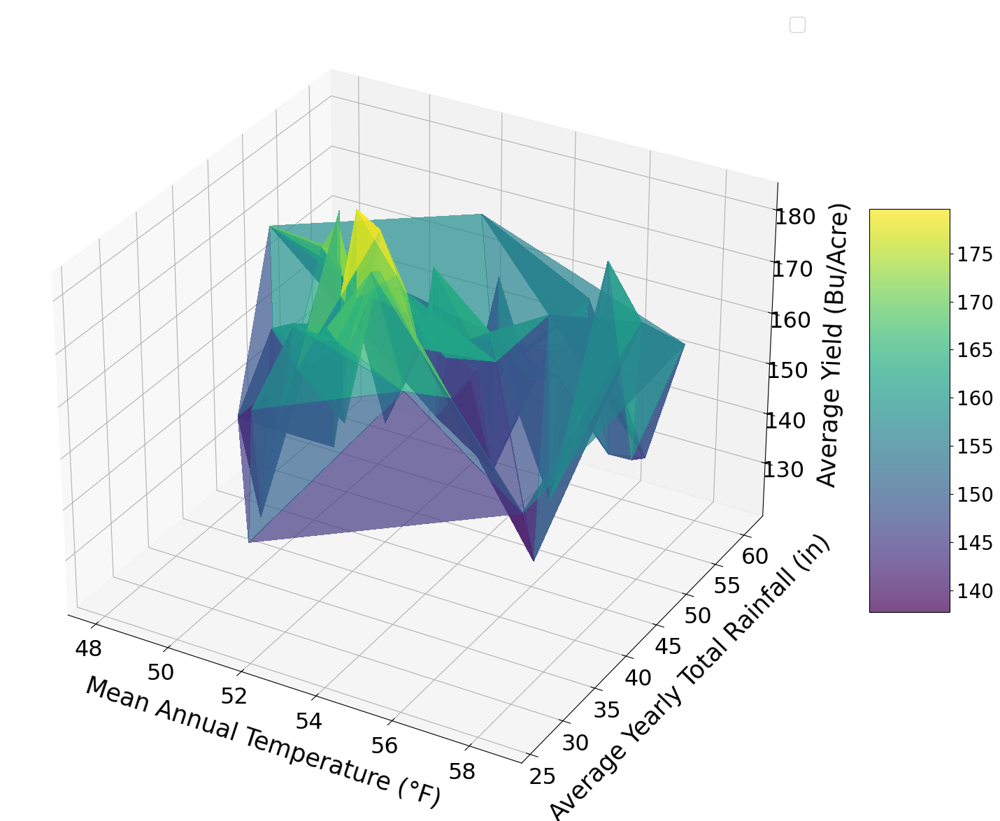

In [ ]:
# use this algorithm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# Assuming df_weather and df_yield are already loaded with necessary data

# Step 1: Extract relevant columns from the yield data
df_yield_relevant = yield_data[['county', 'year', 'Value']]

# Step 2: Ensure the county names and years match the weather data
df_yield_relevant['county'] = df_yield_relevant['county'].str.upper()
weather_data['year'] = weather_data['date'].str.split('-').str[0].astype(int)
weather_data['county'] = weather_data['county'].str.upper()

# Step 3: Merge the weather and yield datasets on 'county' and 'year'
df_merged = pd.merge(weather_data, df_yield_relevant, on=['county', 'year'])

# Step 4: Calculate mean annual temperature per county
mean_temp_per_county = df_merged.groupby('county')['mergedmean_temp'].mean()

# Step 5: Calculate sum of yearly rainfall for all years per county and find the average
avg_rainfall_per_county = df_merged.groupby('county').apply(lambda x: x.groupby('year')['merged_precip'].sum().mean())

# Step 6: Calculate average yield per county
avg_yield_per_county = df_merged.groupby('county')['Value'].mean()

# Step 7: Combine the results into a single DataFrame
df_surface = pd.DataFrame({
    'mean_temp': mean_temp_per_county,
    'avg_rainfall': avg_rainfall_per_county,
    'avg_yield': avg_yield_per_county
}).reset_index()

# Step 8: Identify the max yield and corresponding temperature/rainfall
max_yield_row = df_surface.loc[df_surface['avg_yield'].idxmax()]
max_yield = max_yield_row['avg_yield']
max_temp = max_yield_row['mean_temp']
max_rainfall = max_yield_row['avg_rainfall']

# Step 9: Create a 3D surface plot
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Prepare data for plotting
X = df_surface['mean_temp']
Y = df_surface['avg_rainfall']
Z = df_surface['avg_yield']

# Create a 3D surface plot using trisurf with transparency
surf = ax.plot_trisurf(X, Y, Z, cmap=cm.viridis, alpha=0.7, linewidth=0, antialiased=False)

# Add labels and title with increased font size
ax.set_xlabel('Mean Annual Temperature (°F)', fontsize=25, labelpad=20)  # Adjusting gap with labelpad
ax.set_ylabel('Average Yearly Total Rainfall (in)', fontsize=25, labelpad=20)  # Adjusting gap with labelpad
ax.set_zlabel('Average Yield (Bu/Acre)', fontsize=25, labelpad=20)  # Adjusting gap with labelpad
# plt.title('Surface Plot: Temperature, Rainfall, and Yield', fontsize=25)  # Increased font size for title

# Add color bar for the surface plot
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
cbar.ax.tick_params(labelsize=20)
# Mark the point of maximum yield with a larger font size for the annotation
# ax.scatter(max_temp, max_rainfall, max_yield, color='red', s=100, label=f'Max Yield: {max_yield:.2f} Bu/Acre')

# # Add text annotation with increased font size
# ax.text(max_temp, max_rainfall, max_yield, f'Max Yield\nTemp: {max_temp:.2f}°F\nRain: {max_rainfall:.2f} in',
#         color='red', fontsize=20)  # Increased font size for annotation

# Display legend with increased font size
ax.legend(fontsize=20)  # Increased font size for the legend

# Increase the size of the tick labels (numbers on the axes)
ax.tick_params(axis='both', which='major', labelsize=23)  # Increase tick label font size
ax.tick_params(axis='z', which='major', labelsize=23)  # Increase z-axis tick label font size

# Adjust the gap between the ticks and axis labels by modifying the labelpad for each axis
ax.xaxis.labelpad = 20  # Increase the gap for x-axis label
ax.yaxis.labelpad = 20  # Increase the gap for y-axis label
ax.zaxis.labelpad = 20  # Increase the gap for z-axis label

# Show plot
plt.show()


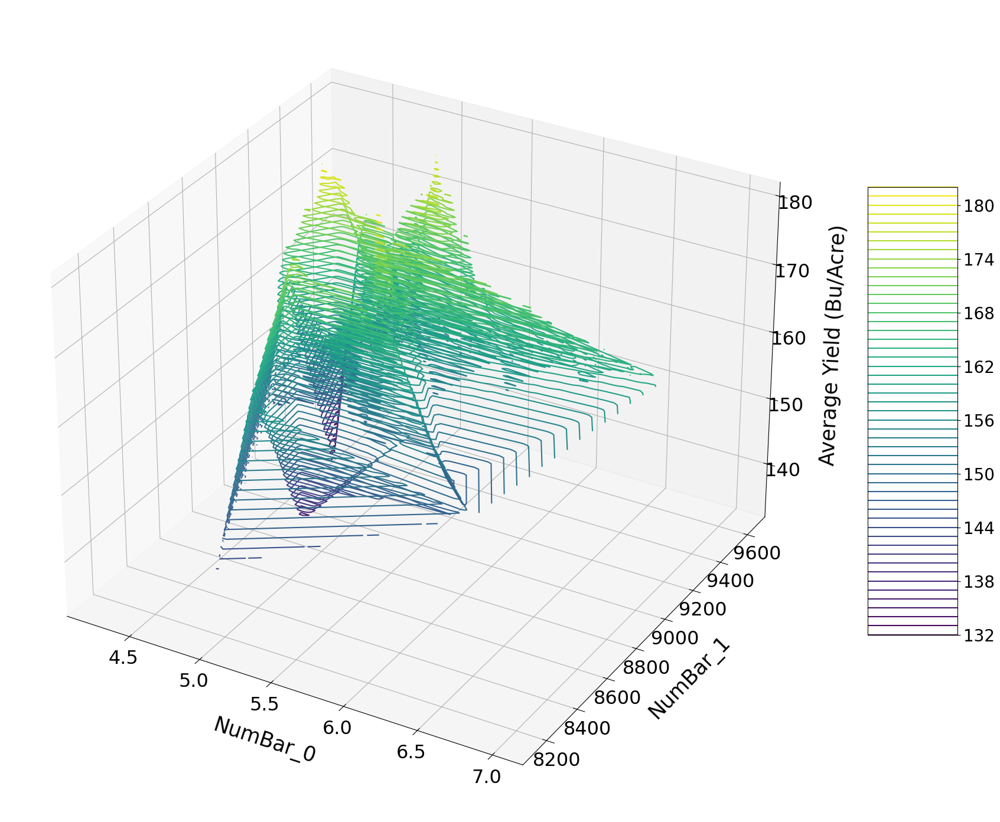

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from scipy.interpolate import griddata

# Assuming yield_data and topo_features are already loaded with necessary data

# Step 1: Extract relevant columns from the yield data
df_yield_relevant = yield_data[['county', 'year', 'Value']]

# Step 2: Ensure the county names and years match the topo features data
df_yield_relevant['county'] = df_yield_relevant['county'].str.upper()
topo_features['county'] = topo_features['county'].str.upper()

# Step 3: Merge the topo features and yield datasets on 'county'
df_merged = pd.merge(topo_features[['county', 'NumBar_0', 'NumBar_1']], df_yield_relevant, on='county')

# Step 4: Calculate average yield per county
avg_yield_per_county = df_merged.groupby('county')['Value'].mean()

# Step 5: Combine the results into a single DataFrame with NumBar_0, NumBar_1, and avg_yield
df_surface = pd.DataFrame({
    'NumBar_0': df_merged.groupby('county')['NumBar_0'].mean(),
    'NumBar_1': df_merged.groupby('county')['NumBar_1'].mean(),
    'avg_yield': avg_yield_per_county
}).reset_index()

# Step 6: Identify the max yield and corresponding NumBar values
max_yield_row = df_surface.loc[df_surface['avg_yield'].idxmax()]
max_yield = max_yield_row['avg_yield']
max_numBar_0 = max_yield_row['NumBar_0']
max_numBar_1 = max_yield_row['NumBar_1']

# Step 7: Create a 3D contour plot
fig = plt.figure(figsize=(18, 16))  # Larger figure size for better spacing
ax = fig.add_subplot(111, projection='3d')

# Prepare data for plotting
X = df_surface['NumBar_0']
Y = df_surface['NumBar_1']
Z = df_surface['avg_yield']

# Create a grid for the contour plot
xgrid, ygrid = np.meshgrid(np.linspace(X.min(), X.max(), 100), np.linspace(Y.min(), Y.max(), 100))

# Interpolate the data onto the grid
zgrid = griddata((X, Y), Z, (xgrid, ygrid), method='linear')

# Plot contour
contour = ax.contour3D(xgrid, ygrid, zgrid, 50, cmap='viridis')

# Add labels and title with increased font size
ax.set_xlabel('NumBar_0', fontsize=25, labelpad=25)  # Adjusting gap with labelpad
ax.set_ylabel('NumBar_1', fontsize=25, labelpad=25)  # Adjusting gap with labelpad
ax.set_zlabel('Average Yield (Bu/Acre)', fontsize=25, labelpad=25)  # Adjusting gap with labelpad

# Add color bar for the contour plot
# This is how you properly add a colorbar for contour3D plots
cbar = fig.colorbar(contour, ax=ax, shrink=0.5, aspect=5)
cbar.ax.tick_params(labelsize=20)

# Increase the size of the tick labels (numbers on the axes)
ax.tick_params(axis='both', which='major', labelsize=23)  # Increase tick label font size
ax.tick_params(axis='z', which='major', labelsize=23)  # Increase z-axis tick label font size

# Adjust the gap between the ticks and axis labels by modifying the labelpad for each axis
ax.xaxis.labelpad = 25  # Increase the gap for x-axis label
ax.yaxis.labelpad = 25  # Increase the gap for y-axis label
ax.zaxis.labelpad = 25  # Increase the gap for z-axis label

# Adjust layout to avoid cutting off text
plt.tight_layout(pad=3.0)  # Add more padding between elements

# Show plot
plt.show()


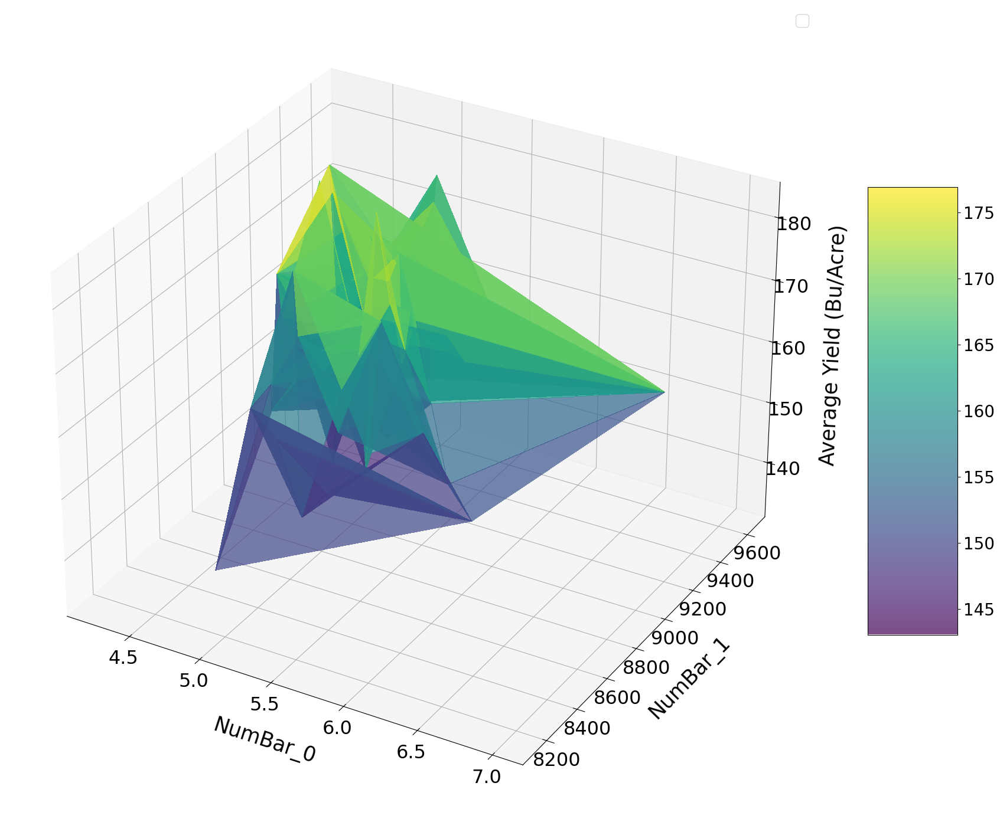

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# Assuming yield_data and topo_features are already loaded with necessary data

# Step 1: Extract relevant columns from the yield data
df_yield_relevant = yield_data[['county', 'year', 'Value']]

# Step 2: Ensure the county names and years match the topo features data
df_yield_relevant['county'] = df_yield_relevant['county'].str.upper()
topo_features['county'] = topo_features['county'].str.upper()

# Step 3: Merge the topo features and yield datasets on 'county'
df_merged = pd.merge(topo_features[['county', 'NumBar_0', 'NumBar_1']], df_yield_relevant, on='county')

# Step 4: Calculate average yield per county
avg_yield_per_county = df_merged.groupby('county')['Value'].mean()

# Step 5: Combine the results into a single DataFrame with NumBar_0, NumBar_1, and avg_yield
df_surface = pd.DataFrame({
    'NumBar_0': df_merged.groupby('county')['NumBar_0'].mean(),
    'NumBar_1': df_merged.groupby('county')['NumBar_1'].mean(),
    'avg_yield': avg_yield_per_county
}).reset_index()

# Step 6: Identify the max yield and corresponding NumBar values
max_yield_row = df_surface.loc[df_surface['avg_yield'].idxmax()]
max_yield = max_yield_row['avg_yield']
max_numBar_0 = max_yield_row['NumBar_0']
max_numBar_1 = max_yield_row['NumBar_1']

# Step 7: Create a 3D surface plot
fig = plt.figure(figsize=(18, 16))  # Larger figure size for better spacing
ax = fig.add_subplot(111, projection='3d')

# Prepare data for plotting
X = df_surface['NumBar_0']
Y = df_surface['NumBar_1']
Z = df_surface['avg_yield']

# Create a 3D surface plot using trisurf with transparency
surf = ax.plot_trisurf(X, Y, Z, cmap=cm.viridis, alpha=0.7, linewidth=0, antialiased=False)

# Add labels and title with increased font size
ax.set_xlabel('NumBar_0', fontsize=25, labelpad=25)  # Adjusting gap with labelpad
ax.set_ylabel('NumBar_1', fontsize=25, labelpad=25)  # Adjusting gap with labelpad
ax.set_zlabel('Average Yield (Bu/Acre)', fontsize=25, labelpad=25)  # Adjusting gap with labelpad

# Add color bar for the surface plot
cbar = fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
cbar.ax.tick_params(labelsize=20)

# Display legend with increased font size
ax.legend(fontsize=20)  # Increased font size for the legend

# Increase the size of the tick labels (numbers on the axes)
ax.tick_params(axis='both', which='major', labelsize=23)  # Increase tick label font size
ax.tick_params(axis='z', which='major', labelsize=23)  # Increase z-axis tick label font size

# Adjust the gap between the ticks and axis labels by modifying the labelpad for each axis
ax.xaxis.labelpad = 25  # Increase the gap for x-axis label
ax.yaxis.labelpad = 25  # Increase the gap for y-axis label
ax.zaxis.labelpad = 25  # Increase the gap for z-axis label

# Adjust layout to avoid cutting off text
plt.tight_layout(pad=3.0)  # Add more padding between elements

# Show plot
plt.show()


In [46]:
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})
counties = counties.to_crs(epsg=26916)  # Reproject to NAD83 / UTM zone 16N = counties_with_topo.to_crs(epsg=26916)  # Reproject to NAD83 / UTM zone 16N
# Calculate centroids of each county polygon
counties['centroid'] = counties.geometry.centroid

# Extract X and Y coordinates of the centroids
counties['longitude'] = counties['centroid'].x
counties['latitude'] = counties['centroid'].y

# Show the first few rows to confirm the centroids
print(counties[['county', 'longitude', 'latitude']].head())


      county      longitude      latitude
0    STEUBEN  666496.688001  4.612172e+06
1   LAGRANGE  631044.208879  4.611298e+06
2    ELKHART  595111.893585  4.605700e+06
3  ST JOSEPH  559163.767046  4.607466e+06
4       LAKE  468555.283327  4.591188e+06


In [ ]:
# Ensure 'county' column is in the same format (case-insensitive) in both datasets
# Merge the topo features (numBar0) with counties
counties_with_topo = counties.merge(topo_features, on='county', how='left')

# Merge yield data
counties_with_topo = counties_with_topo.merge(yield_data, on='county', how='left')


# Check the merged data
counties_with_topo.columns


Index(['AREA', 'PERIMETER', 'county', 'NAME_L', 'NCAPC', 'CNTY_FIPS', 'STFID',
       'POP2000', 'WHITE', 'BLACK', 'AMERI_ES', 'ASIAN', 'HAWN_PI', 'OTHER',
       'MULT_RACE', 'HISPANIC', 'MALES', 'FEMALES', 'AGE_UNDER5', 'AGE_5_17',
       'AGE_18_21', 'AGE_22_29', 'AGE_30_39', 'AGE_40_49', 'AGE_50_64',
       'AGE_65_UP', 'MED_AGE', 'MED_AGE_M', 'MED_AGE_F', 'HOUSEHOLDS',
       'AVE_HH_SZ', 'HSEHLD_1_M', 'HSEHLD_1_F', 'MARHH_CHD', 'MARHH_NO_C',
       'MHH_CHILD', 'FHH_CHILD', 'FAMILIES', 'AVE_FAM_SZ', 'HSE_UNITS',
       'VACANT', 'OWNER_OCC', 'RENTER_OCC', 'geometry', 'centroid',
       'longitude', 'latitude', 'year_x', 'BirthMean_0', 'DeathMean_0',
       'LifeMean_0', 'NumBar_0', 'BirthMean_1', 'DeathMean_1', 'LifeMean_1',
       'NumBar_1', 'DistQ0', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
       'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4', 'year_y',
       'Value'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy.interpolate import griddata
from matplotlib import cm

# Load the shapefile (Indiana counties)
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})
# Step 1: Check the CRS of the shapefile
print(counties)  # This should print the CRS of the shapefile (EPSG:26916)



# Assuming 'counties' is your GeoDataFrame with the 'geometry' column

# Step 1: Check the CRS to ensure it's in a projected CRS (e.g., EPSG:26916)
print(f"Original CRS: {counties.crs}")

# Step 2: Convert the CRS to EPSG:4326 (latitude/longitude)
counties = counties.to_crs('EPSG:4326')
print(f"Converted to CRS: {counties.crs}")

# Step 3: Extract X (longitude) and Y (latitude) coordinates from the geometry
# The .geometry column stores geometries, from which we extract the centroid or geometry points
counties['longitude'] = counties.geometry.centroid.x  # X coordinate of centroid (longitude)
counties['latitude'] = counties.geometry.centroid.y  # Y coordinate of centroid (latitude)

# Step 4: Print the first few rows to check the conversion
print(counties[['longitude', 'latitude']].head())



            AREA     PERIMETER       county       NAME_L  NCAPC CNTY_FIPS  \
0   8.352031e+08  116410.31836      STEUBEN      Steuben     76       151   
1   1.001560e+09  129036.36824     LAGRANGE     Lagrange     44       087   
2   1.211453e+09  139308.15005      ELKHART      Elkhart     20       039   
3   1.194457e+09  155508.91992    ST JOSEPH    St Joseph     71       141   
4   1.620569e+09  177807.09411         LAKE         Lake     45       089   
..           ...           ...          ...          ...    ...       ...   
87  9.997524e+08  181798.85043        PERRY        Perry     62       123   
88  1.012324e+09  162491.58827      WARRICK      Warrick     87       173   
89  1.085315e+09  225886.71328        POSEY        Posey     65       129   
90  1.038928e+09  192142.95176      SPENCER      Spencer     74       147   
91  6.113584e+08  133816.83216  VANDERBURGH  Vanderburgh     82       163   

    STFID  POP2000   WHITE   BLACK  ...  MARHH_NO_C  MHH_CHILD  FHH_CHILD  

<ipython-input-13-a1f0f3c52260>:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['longitude'] = counties.geometry.centroid.x  # X coordinate of centroid (longitude)
<ipython-input-13-a1f0f3c52260>:28: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['latitude'] = counties.geometry.centroid.y  # Y coordinate of centroid (latitude)


<ipython-input-14-55b45975d8b9>:16: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['longitude'] = counties.geometry.centroid.x  # Longitude
<ipython-input-14-55b45975d8b9>:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['latitude'] = counties.geometry.centroid.y   # Latitude


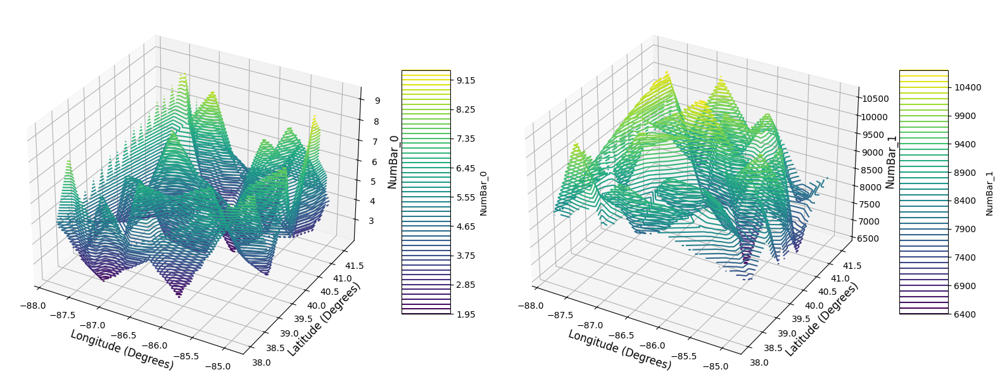

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import geopandas as gpd
from matplotlib.colors import Normalize
from scipy.interpolate import griddata

# Step 1: Load Indiana shapefile (already done)
# counties = gpd.read_file('/path_to_your_shapefile')

# Step 2: Convert CRS to EPSG:4326 (latitude/longitude)
counties = counties.to_crs('EPSG:4326')

# Step 3: Extract centroid coordinates (longitude and latitude)
counties['longitude'] = counties.geometry.centroid.x  # Longitude
counties['latitude'] = counties.geometry.centroid.y   # Latitude

# Step 4: Merge the county centroids with the topo features (NumBar_0 and NumBar_1)
merged_data = pd.merge(counties[['county', 'longitude', 'latitude']], topo_features[['county', 'NumBar_0', 'NumBar_1']], on='county')

# Step 1: Extract latitude, longitude, NumBar_0, and NumBar_1 for plotting
longitude = merged_data['longitude']
latitude = merged_data['latitude']
NumBar_0 = merged_data['NumBar_0']
NumBar_1 = merged_data['NumBar_1']

# Step 2: Create grid of longitude and latitude for interpolation
lon_grid = np.linspace(longitude.min(), longitude.max(), 100)  # Adjust grid resolution if needed
lat_grid = np.linspace(latitude.min(), latitude.max(), 100)

# Create mesh grid for plotting
lon_grid, lat_grid = np.meshgrid(lon_grid, lat_grid)

# Step 3: Interpolate NumBar_0 and NumBar_1 onto the grid
NumBar_0_grid = griddata((longitude, latitude), NumBar_0, (lon_grid, lat_grid), method='linear')
NumBar_1_grid = griddata((longitude, latitude), NumBar_1, (lon_grid, lat_grid), method='linear')

# Step 4: Create 2 subplots for two 3D contour plots (NumBar_0 and NumBar_1)
fig = plt.figure(figsize=(16, 8))

# Plot for NumBar_0
ax1 = fig.add_subplot(121, projection='3d')
contour1 = ax1.contour3D(lon_grid, lat_grid, NumBar_0_grid, 50, cmap='viridis')
ax1.set_xlabel('Longitude (Degrees)', fontsize=12)
ax1.set_ylabel('Latitude (Degrees)', fontsize=12)
ax1.set_zlabel('NumBar_0', fontsize=12)
# ax1.set_title('3D Contour Plot of NumBar_0', fontsize=15)

# Plot for NumBar_1
ax2 = fig.add_subplot(122, projection='3d')
contour2 = ax2.contour3D(lon_grid, lat_grid, NumBar_1_grid, 50, cmap='viridis')
ax2.set_xlabel('Longitude (Degrees)', fontsize=12)
ax2.set_ylabel('Latitude (Degrees)', fontsize=12)
ax2.set_zlabel('NumBar_1', fontsize=12)
# ax2.set_title('3D Contour Plot of NumBar_1', fontsize=15)

# Add colorbars for both subplots
fig.colorbar(contour1, ax=ax1, shrink=0.5, aspect=5, label='NumBar_0')
fig.colorbar(contour2, ax=ax2, shrink=0.5, aspect=5, label='NumBar_1')

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
soil_data = soil_data[['county', 'aws0_5', 'aws5_20',
       'aws20_50', 'aws0_20', 'soc0_20', 'soc0_30',
       'nccpi3corn', 'slope_r', 'elev_r',
        'W_avg_silt', 'W_avg_clay']]

In [ ]:
'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import geopandas as gpd
from matplotlib.colors import Normalize
from scipy.interpolate import griddata

# Step 1: Load Indiana shapefile (already done)
# counties = gpd.read_file('/path_to_your_shapefile')

# Step 2: Convert CRS to EPSG:4326 (latitude/longitude)
counties = counties.to_crs('EPSG:4326')

# Step 3: Extract centroid coordinates (longitude and latitude)
counties['longitude'] = counties.geometry.centroid.x  # Longitude
counties['latitude'] = counties.geometry.centroid.y   # Latitude

# Step 4: Merge the county centroids with the topo features (NumBar_0 and NumBar_1)
merged_data = pd.merge(counties[['county', 'longitude', 'latitude']], soil_data[['county', 'nccpi3corn', 'slope_r', 'elev_r',
        'W_avg_silt', 'W_avg_clay']], on='county')

# Step 1: Extract latitude, longitude, NumBar_0, and NumBar_1 for plotting
longitude = merged_data['longitude']
latitude = merged_data['latitude']
nccpi = merged_data['nccpi3corn']
W_avg_silt = merged_data['W_avg_silt']
W_avg_clay = merged_data['W_avg_clay']
slope = merged_data['slope_r']
elev = merged_data['elev_r']

# Step 2: Create grid of longitude and latitude for interpolation
lon_grid = np.linspace(longitude.min(), longitude.max(), 100)  # Adjust grid resolution if needed
lat_grid = np.linspace(latitude.min(), latitude.max(), 100)

# Create mesh grid for plotting
lon_grid, lat_grid = np.meshgrid(lon_grid, lat_grid)

# Step 3: Interpolate NumBar_0 and NumBar_1 onto the grid
nccpi_grid= griddata((longitude, latitude), nccpi, (lon_grid, lat_grid), method='linear')
W_avg_clay_grid = griddata((longitude, latitude), W_avg_clay, (lon_grid, lat_grid), method='linear')
W_avg_silt_grid = griddata((longitude, latitude), W_avg_silt, (lon_grid, lat_grid), method='linear')
slope_grid = griddata((longitude, latitude), slope, (lon_grid, lat_grid), method='linear')
elev_grid = griddata((longitude, latitude), elev, (lon_grid, lat_grid), method='linear')
# Display the plot
plt.subplots_adjust(wspace=0.1, hspace=0.2)
# Step 4: Create 2 subplots for two 3D contour plots (NumBar_0 and NumBar_1)
fig = plt.figure(figsize=(20, 12))

# Plot for NumBar_0
ax1 = fig.add_subplot(221, projection='3d')
contour1 = ax1.contour3D(lon_grid, lat_grid, nccpi_grid, 50, cmap='viridis')
ax1.set_xlabel('Longitude (Degrees)', fontsize=12)
ax1.set_ylabel('Latitude (Degrees)', fontsize=12)
ax1.set_zlabel('NCCPI', fontsize=12)
# ax1.set_title('3D Contour Plot of NumBar_0', fontsize=15)

# Plot for NumBar_1
ax2 = fig.add_subplot(222, projection='3d')
contour2 = ax2.contour3D(lon_grid, lat_grid, W_avg_clay_grid, 50, cmap='viridis')
ax2.set_xlabel('Longitude (Degrees)', fontsize=12)
ax2.set_ylabel('Latitude (Degrees)', fontsize=12)
ax2.set_zlabel('Average % clay', fontsize=12)
# ax2.set_title('3D Contour Plot of NumBar_1', fontsize=15)

ax3 = fig.add_subplot(223, projection='3d')
contour3 = ax3.contour3D(lon_grid, lat_grid, W_avg_silt_grid, 50, cmap='viridis')
ax3.set_xlabel('Longitude (Degrees)', fontsize=12)
ax3.set_ylabel('Latitude (Degrees)', fontsize=12)
ax3.set_zlabel('Average % silt', fontsize=12)

ax4 = fig.add_subplot(224, projection='3d')
contour4 = ax4.contour3D(lon_grid, lat_grid, slope_grid, 50, cmap='viridis')
ax4.set_xlabel('Longitude (Degrees)', fontsize=12)
ax4.set_ylabel('Latitude (Degrees)', fontsize=12)
ax4.set_zlabel('Slope', fontsize=12)

# Add colorbars for both subplots
fig.colorbar(contour1, ax=ax1, shrink=0.5, aspect=5, label='NCCPI')
fig.colorbar(contour2, ax=ax2, shrink=0.5, aspect=5, label='% Clay')
fig.colorbar(contour3, ax=ax3, shrink=0.5, aspect=5, label='% Silt')
fig.colorbar(contour4, ax=ax4, shrink=0.5, aspect=5, label='Slope')

# Display the plot
plt.subplots_adjust(wspace=0.00, hspace=0.02)
plt.tight_layout()
plt.show()
'''

<ipython-input-46-31438d951e13>:18: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['longitude'] = counties.geometry.centroid.x  # Longitude
<ipython-input-46-31438d951e13>:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['latitude'] = counties.geometry.centroid.y   # Latitude
<ipython-input-46-31438d951e13>:67: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  indiana_boundary = counties.unary_union  # Combine all county polygons into a single boundary


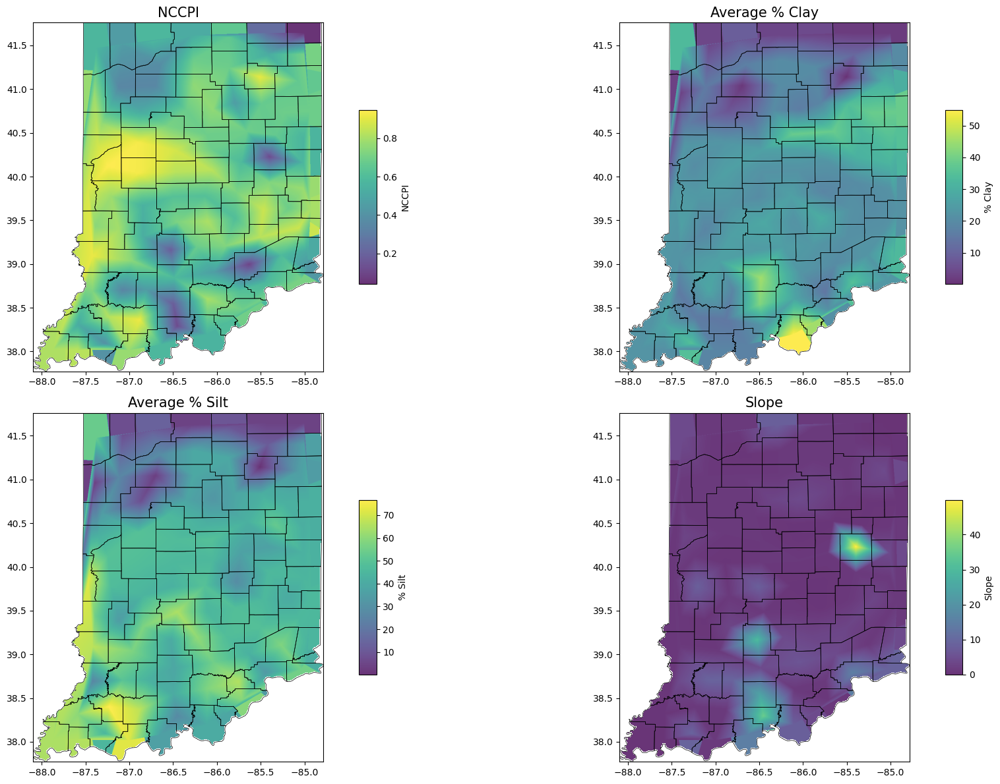

In [ ]:
import pandas as pd
import numpy as np
import cupy as cp  # CuPy for GPU-accelerated computations
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.interpolate import griddata
import geopandas as gpd
from shapely.geometry import Point, Polygon

# Step 1: Load Indiana shapefile
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})

# Step 2: Convert CRS to EPSG:4326 (latitude/longitude)
counties = counties.to_crs('EPSG:4326')

# Step 3: Extract centroid coordinates (longitude and latitude)
counties['longitude'] = counties.geometry.centroid.x  # Longitude
counties['latitude'] = counties.geometry.centroid.y   # Latitude

# Step 4: Merge the county centroids with the soil data
merged_data = pd.merge(
    counties[['county', 'geometry', 'longitude', 'latitude']],
    soil_data[['county', 'nccpi3corn', 'slope_r', 'elev_r', 'W_avg_silt', 'W_avg_clay']],
    on='county'
)

# Step 5: Transfer data to GPU using CuPy
longitude = cp.asarray(merged_data['longitude'].values)
latitude = cp.asarray(merged_data['latitude'].values)
nccpi = cp.asarray(merged_data['nccpi3corn'].values)
W_avg_silt = cp.asarray(merged_data['W_avg_silt'].values)
W_avg_clay = cp.asarray(merged_data['W_avg_clay'].values)
slope = cp.asarray(merged_data['slope_r'].values)

# Create a finer grid of longitude and latitude (on GPU)
lon_grid = cp.linspace(counties.total_bounds[0], counties.total_bounds[2], 1000)  # Use shapefile bounds
lat_grid = cp.linspace(counties.total_bounds[1], counties.total_bounds[3], 1000)
lon_grid, lat_grid = cp.meshgrid(lon_grid, lat_grid)

# Step 6: Interpolate data onto the grid using griddata (processed on the CPU)
lon_grid_cpu = cp.asnumpy(lon_grid)
lat_grid_cpu = cp.asnumpy(lat_grid)
longitude_cpu = cp.asnumpy(longitude)
latitude_cpu = cp.asnumpy(latitude)

nccpi_grid = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(nccpi),
                      (lon_grid_cpu, lat_grid_cpu), method='linear')
W_avg_clay_grid = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(W_avg_clay),
                           (lon_grid_cpu, lat_grid_cpu), method='linear')
W_avg_silt_grid = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(W_avg_silt),
                           (lon_grid_cpu, lat_grid_cpu), method='linear')
slope_grid = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(slope),
                      (lon_grid_cpu, lat_grid_cpu), method='linear')

# Fill NaNs caused by interpolation gaps using nearest neighbors
nccpi_grid[np.isnan(nccpi_grid)] = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(nccpi),
                                            (lon_grid_cpu, lat_grid_cpu), method='nearest')[np.isnan(nccpi_grid)]
W_avg_clay_grid[np.isnan(W_avg_clay_grid)] = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(W_avg_clay),
                                                      (lon_grid_cpu, lat_grid_cpu), method='nearest')[np.isnan(W_avg_clay_grid)]
W_avg_silt_grid[np.isnan(W_avg_silt_grid)] = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(W_avg_silt),
                                                      (lon_grid_cpu, lat_grid_cpu), method='nearest')[np.isnan(W_avg_silt_grid)]
slope_grid[np.isnan(slope_grid)] = griddata((longitude_cpu, latitude_cpu), cp.asnumpy(slope),
                                            (lon_grid_cpu, lat_grid_cpu), method='nearest')[np.isnan(slope_grid)]

# Step 7: Create a unified Indiana boundary polygon
indiana_boundary = counties.unary_union  # Combine all county polygons into a single boundary

# Step 8: Mask areas outside the Indiana boundary
indiana_mask = np.zeros(nccpi_grid.shape, dtype=bool)
for i in range(lon_grid_cpu.shape[0]):
    for j in range(lat_grid_cpu.shape[1]):
        point = Point(lon_grid_cpu[i, j], lat_grid_cpu[i, j])
        if indiana_boundary.contains(point):
            indiana_mask[i, j] = True

# Apply the mask to ensure only Indiana areas are shown
nccpi_grid[~indiana_mask] = np.nan
W_avg_clay_grid[~indiana_mask] = np.nan
W_avg_silt_grid[~indiana_mask] = np.nan
slope_grid[~indiana_mask] = np.nan

# Step 9: Plot Indiana map with overlays
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# NCCPI Plot
ax1 = axes[0, 0]
counties.boundary.plot(ax=ax1, color="black", linewidth=0.5)
im1 = ax1.imshow(nccpi_grid, extent=(counties.total_bounds[0], counties.total_bounds[2],
                                     counties.total_bounds[1], counties.total_bounds[3]),
                 origin='lower', cmap='viridis', alpha=0.8)
ax1.set_title("NCCPI", fontsize=15)
fig.colorbar(im1, ax=ax1, shrink=0.5, aspect=10, label="NCCPI")

# Average Clay Plot
ax2 = axes[0, 1]
counties.boundary.plot(ax=ax2, color="black", linewidth=0.5)
im2 = ax2.imshow(W_avg_clay_grid, extent=(counties.total_bounds[0], counties.total_bounds[2],
                                          counties.total_bounds[1], counties.total_bounds[3]),
                 origin='lower', cmap='viridis', alpha=0.8)
ax2.set_title("Average % Clay", fontsize=15)
fig.colorbar(im2, ax=ax2, shrink=0.5, aspect=10, label="% Clay")

# Average Silt Plot
ax3 = axes[1, 0]
counties.boundary.plot(ax=ax3, color="black", linewidth=0.5)
im3 = ax3.imshow(W_avg_silt_grid, extent=(counties.total_bounds[0], counties.total_bounds[2],
                                          counties.total_bounds[1], counties.total_bounds[3]),
                 origin='lower', cmap='viridis', alpha=0.8)
ax3.set_title("Average % Silt", fontsize=15)
fig.colorbar(im3, ax=ax3, shrink=0.5, aspect=10, label="% Silt")

# Slope Plot
ax4 = axes[1, 1]
counties.boundary.plot(ax=ax4, color="black", linewidth=0.5)
im4 = ax4.imshow(slope_grid, extent=(counties.total_bounds[0], counties.total_bounds[2],
                                     counties.total_bounds[1], counties.total_bounds[3]),
                 origin='lower', cmap='viridis', alpha=0.8)
ax4.set_title("Slope", fontsize=15)
fig.colorbar(im4, ax=ax4, shrink=0.5, aspect=10, label="Slope")

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
!pip install pysal

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 36.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 72.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.9/53.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4

In [ ]:
pip install splot

Global Moran's I for NumBar_0:
Moran's I: 0.0038
p-value: 0.1050
z-score: 1.3023

Global Moran's I for NumBar_1:
Moran's I: 0.0187
p-value: 0.0010
z-score: 5.4841


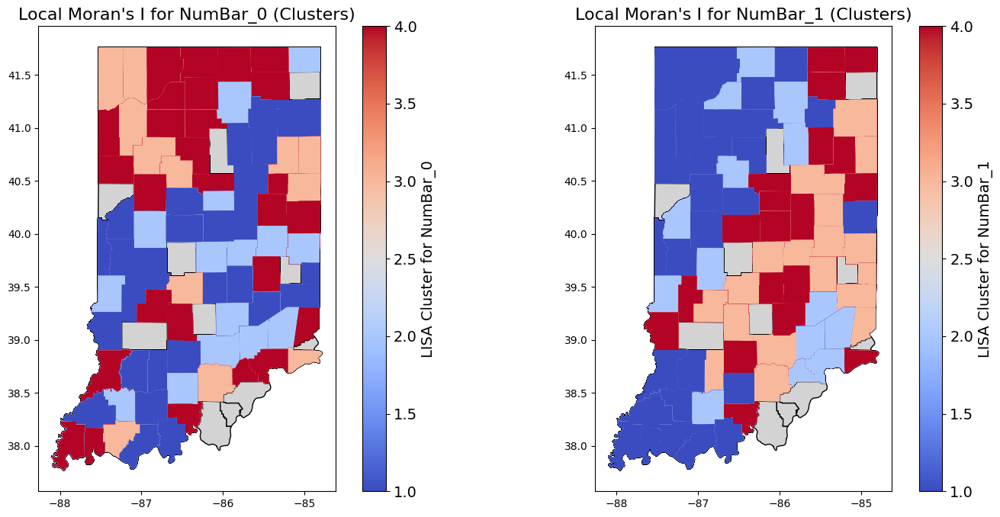

In [ ]:
import geopandas as gpd
import numpy as np
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import lisa_cluster
import matplotlib.pyplot as plt

# Step 1: Load the Indiana shapefile
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})

# Step 2: Convert CRS to EPSG:4326
counties = counties.to_crs('EPSG:4326')

# Step 3: Merge shapefile with NumBar_0 and NumBar_1 data
# Assuming `data` is a DataFrame with columns ['county', 'NumBar_0', 'NumBar_1']
data = topo_features[['county', 'NumBar_0', 'NumBar_1']]  # Replace `soil_data` with your dataset variable name
merged = counties.merge(data, on='county', how='left')  # Use 'left' join to keep all counties

# Step 4: Check for missing data and create a flag
merged['missing_data'] = merged[['NumBar_0', 'NumBar_1']].isnull().any(axis=1)

# Step 5: Create a spatial weights matrix (Queen Contiguity)
w = weights.Queen.from_dataframe(merged, use_index=True)
w.transform = 'r'  # Row-standardize the weights

# Step 6: Calculate Global Moran’s I
# Ensure no NaN values for calculation
numbar_0 = merged['NumBar_0'].fillna(0)  # Fill NaN with 0 for Moran's calculation
numbar_1 = merged['NumBar_1'].fillna(0)

moran_numbar_0 = esda.Moran(numbar_0, w)
moran_numbar_1 = esda.Moran(numbar_1, w)

# Step 7: Print Global Moran's I results
print("Global Moran's I for NumBar_0:")
print(f"Moran's I: {moran_numbar_0.I:.4f}")
print(f"p-value: {moran_numbar_0.p_sim:.4f}")
print(f"z-score: {moran_numbar_0.z_sim:.4f}")

print("\nGlobal Moran's I for NumBar_1:")
print(f"Moran's I: {moran_numbar_1.I:.4f}")
print(f"p-value: {moran_numbar_1.p_sim:.4f}")
print(f"z-score: {moran_numbar_1.z_sim:.4f}")

# Step 8: Add Local Moran’s I results for mapping
local_moran_numbar_0 = esda.Moran_Local(numbar_0, w)
local_moran_numbar_1 = esda.Moran_Local(numbar_1, w)

merged['NumBar_0_Local_I'] = local_moran_numbar_0.Is
merged['NumBar_0_Cluster'] = local_moran_numbar_0.q

merged['NumBar_1_Local_I'] = local_moran_numbar_1.Is
merged['NumBar_1_Cluster'] = local_moran_numbar_1.q

# Step 9: Plot LISA cluster maps with missing data highlighted
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Increase font size globally
plt.rcParams.update({'font.size': 14})

# Base map with missing data highlighted
base_color = 'lightgray'
merged.plot(ax=axes[0], color=base_color, edgecolor='black', legend=True)
merged[~merged['missing_data']].plot(column='NumBar_0_Cluster', cmap='coolwarm', legend=True,
                                     legend_kwds={'label': "LISA Cluster for NumBar_0"}, ax=axes[0])
axes[0].set_title("Local Moran's I for NumBar_0 (Clusters)", fontsize=16)

# Base map for NumBar_1 with missing data highlighted
merged.plot(ax=axes[1], color=base_color, edgecolor='black', legend=True)
merged[~merged['missing_data']].plot(column='NumBar_1_Cluster', cmap='coolwarm', legend=True,
                                     legend_kwds={'label': "LISA Cluster for NumBar_1"}, ax=axes[1])
axes[1].set_title("Local Moran's I for NumBar_1 (Clusters)", fontsize=16)

# Reduce gaps between figures
plt.subplots_adjust(wspace=0.3, hspace=0.1)

plt.tight_layout()
plt.show()


Global Moran's I for NCCPI:
Moran's I: 0.1930
p-value: 0.0040
z-score: 3.1441

Global Moran's I for Silt:
Moran's I: 0.4037
p-value: 0.0010
z-score: 6.5195

Global Moran's I for Clay:
Moran's I: 0.3517
p-value: 0.0010
z-score: 5.6486


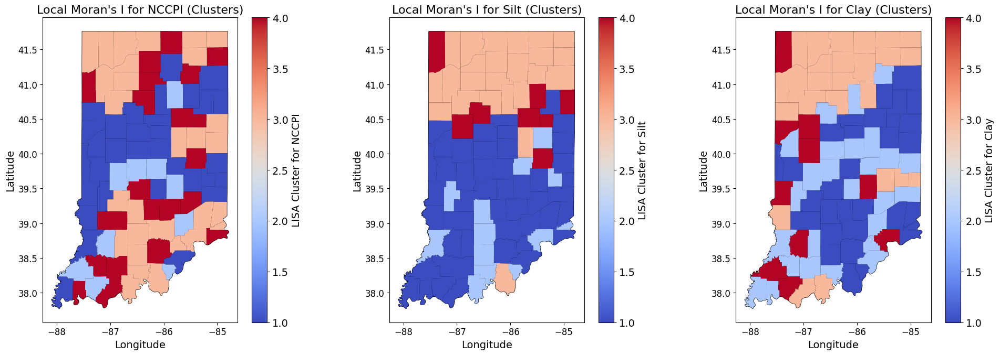

In [ ]:
import geopandas as gpd
import numpy as np
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import lisa_cluster
import matplotlib.pyplot as plt

# Step 1: Load the Indiana shapefile
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})

# Step 2: Convert CRS to EPSG:4326
counties = counties.to_crs('EPSG:4326')

# Step 3: Merge shapefile with NCCPI, silt, and clay data
# Assuming `data` is a DataFrame with columns ['county', 'NCCPI', 'Silt', 'Clay']
data = soil_data[['county', 'nccpi3corn', 'W_avg_silt', 'W_avg_clay']]  # Replace `soil_data` with your dataset variable name
merged = counties.merge(data, on='county', how='left')  # Use 'left' join to keep all counties

# Step 4: Check for missing data and create a flag
merged['missing_data'] = merged[['nccpi3corn', 'W_avg_silt', 'W_avg_clay']].isnull().any(axis=1)

# Step 5: Create a spatial weights matrix (Queen Contiguity)
w = weights.Queen.from_dataframe(merged, use_index=True)
w.transform = 'r'  # Row-standardize the weights

# Step 6: Calculate Global Moran’s I
# Ensure no NaN values for calculation
nccpi = merged['nccpi3corn'].fillna(0)  # Fill NaN with 0 for Moran's calculation
silt = merged['W_avg_silt'].fillna(0)
clay = merged['W_avg_clay'].fillna(0)

moran_nccpi = esda.Moran(nccpi, w)
moran_silt = esda.Moran(silt, w)
moran_clay = esda.Moran(clay, w)

# Step 7: Print Global Moran's I results
print("Global Moran's I for NCCPI:")
print(f"Moran's I: {moran_nccpi.I:.4f}")
print(f"p-value: {moran_nccpi.p_sim:.4f}")
print(f"z-score: {moran_nccpi.z_sim:.4f}")

print("\nGlobal Moran's I for Silt:")
print(f"Moran's I: {moran_silt.I:.4f}")
print(f"p-value: {moran_silt.p_sim:.4f}")
print(f"z-score: {moran_silt.z_sim:.4f}")

print("\nGlobal Moran's I for Clay:")
print(f"Moran's I: {moran_clay.I:.4f}")
print(f"p-value: {moran_clay.p_sim:.4f}")
print(f"z-score: {moran_clay.z_sim:.4f}")

# Step 8: Add Local Moran’s I results for mapping
local_moran_nccpi = esda.Moran_Local(nccpi, w)
local_moran_silt = esda.Moran_Local(silt, w)
local_moran_clay = esda.Moran_Local(clay, w)

merged['NCCPI_Local_I'] = local_moran_nccpi.Is
merged['NCCPI_Cluster'] = local_moran_nccpi.q

merged['Silt_Local_I'] = local_moran_silt.Is
merged['Silt_Cluster'] = local_moran_silt.q

merged['Clay_Local_I'] = local_moran_clay.Is
merged['Clay_Cluster'] = local_moran_clay.q

# Step 9: Plot LISA cluster maps with missing data highlighted
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Increase font size globally
plt.rcParams.update({'font.size': 14})

# Base map with missing data highlighted
base_color = 'lightgray'

# NCCPI Map
merged.plot(ax=axes[0], color=base_color, edgecolor='black', legend=False)
merged[~merged['missing_data']].plot(column='NCCPI_Cluster', cmap='coolwarm', legend=True,
                                     legend_kwds={'label': "LISA Cluster for NCCPI"}, ax=axes[0])
axes[0].set_title("Local Moran's I for NCCPI (Clusters)", fontsize=16)
axes[0].set_xlabel("Longitude", fontsize=14)
axes[0].set_ylabel("Latitude", fontsize=14)
axes[0].tick_params(axis='both', which='major', labelsize=12)

# Silt Map
merged.plot(ax=axes[1], color=base_color, edgecolor='black', legend=False)
merged[~merged['missing_data']].plot(column='Silt_Cluster', cmap='coolwarm', legend=True,
                                     legend_kwds={'label': "LISA Cluster for Silt"}, ax=axes[1])
axes[1].set_title("Local Moran's I for Silt (Clusters)", fontsize=16)
axes[1].set_xlabel("Longitude", fontsize=14)
axes[1].set_ylabel("Latitude", fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=12)

# Clay Map
merged.plot(ax=axes[2], color=base_color, edgecolor='black', legend=False)
merged[~merged['missing_data']].plot(column='Clay_Cluster', cmap='coolwarm', legend=True,
                                     legend_kwds={'label': "LISA Cluster for Clay"}, ax=axes[2])
axes[2].set_title("Local Moran's I for Clay (Clusters)", fontsize=16)
axes[2].set_xlabel("Longitude", fontsize=14)
axes[2].set_ylabel("Latitude", fontsize=14)
axes[2].tick_params(axis='both', which='major', labelsize=12)

# Reduce gaps between figures
plt.subplots_adjust(wspace=0.3, hspace=0.1)

plt.tight_layout()
plt.show()


In [18]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Importing for 3D plotting
import numpy as np

# Ensure rainfall data and Z-scores are properly prepared in gdf_precip
# Assuming gdf_precip is already created with 'rainfall' and 'z_score'

# Load the shapefile and merge with your calculated Z-scores if not already done
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shapefile_path)
gdf['county'] = gdf['NAME_U'].str.upper()
gdf = gdf.to_crs('EPSG:4326')
# Calculate yearly mean rainfall for each county
# Ensure relevant columns are numeric
for col in ['mergedmax_temp', 'mergedmean_temp', 'mergedmin_temp', 'merged_precip', 'gdd']:
    weather_data[col] = pd.to_numeric(weather_data[col], errors='coerce')

# Calculate yearly mean for each county
weather_data_grouped = weather_data.groupby('county').mean(numeric_only=True).reset_index()

# Rename columns to their new names
weather_data_grouped.rename(columns={
    'mergedmax_temp': 'max_meant',      # New name for maximum temperature
    'mergedmean_temp': 'meanmeanT',    # New name for overall mean temperature
    'mergedmin_temp': 'minmeanT',      # New name for minimum temperature
    'merged_precip': 'precip_mean',    # New name for precipitation
    'gdd': 'gdd_mean'                  # New name for growing degree days
}, inplace=True)

# Calculate Z-scores for precipitation ('precip_mean')
precip_mean = weather_data_grouped['precip_mean']
precip_mean_mean = precip_mean.mean()
precip_mean_std = precip_mean.std()
weather_data_grouped['z_score_precip'] = (precip_mean - precip_mean_mean) / precip_mean_std

# Calculate Z-scores for mean temperature ('meanmeanT')
mean_temp = weather_data_grouped['meanmeanT']
mean_temp_mean = mean_temp.mean()
mean_temp_std = mean_temp.std()
weather_data_grouped['z_score_mean_temp'] = (mean_temp - mean_temp_mean) / mean_temp_std

# Merge Z-scores and renamed columns back into the GeoDataFrame
gdf_precip = gdf.merge(weather_data_grouped, on='county', how='left')

# Ensure GeoPandas recognizes geometry
gdf_precip = gpd.GeoDataFrame(gdf_precip, geometry=gdf.geometry)

In [16]:
gdf_precip

,AREA,PERIMETER,NAME_U,NAME_L,NCAPC,CNTY_FIPS,STFID,POP2000,WHITE,BLACK,...,RENTER_OCC,geometry,county,max_meant,meanmeanT,minmeanT,precip_mean,gdd_mean,z_score_precip,z_score_mean_temp
0,8.352031e+08,116410.31836,STEUBEN,Steuben,76,151,18151,33214,32281,123,...,2787,"POLYGON ((679527.291 4625396.026, 681172.04 46...",STEUBEN,58.204119,48.482060,38.761571,0.114072,7.468988,-0.988285,-1.744944
1,1.001560e+09,129036.36824,LAGRANGE,Lagrange,44,087,18087,34909,33770,66,...,2074,"POLYGON ((648336.954 4624638.241, 649912.369 4...",LAGRANGE,59.206495,49.410485,39.619327,0.110128,7.843936,-1.246241,-1.357627
2,1.211453e+09,139308.15005,ELKHART,Elkhart,20,039,18039,182791,157931,9551,...,18385,"POLYGON ((609782.908 4623876.537, 611399.543 4...",ELKHART,59.999821,50.561232,41.125476,0.114662,8.527321,-0.949718,-0.877563
3,1.194457e+09,155508.91992,ST JOSEPH,St Joseph,71,141,18141,265559,218706,30422,...,28549,"POLYGON ((576360.816 4623609.402, 577920.195 4...",ST JOSEPH,59.211391,49.557767,39.865188,0.117868,7.990097,-0.739981,-1.296184
4,1.620569e+09,177807.09411,LAKE,Lake,45,089,18089,484564,323290,122723,...,56384,"POLYGON ((458433.478 4623270.678, 481438.856 4...",LAKE,60.289185,50.005446,39.730579,0.115566,8.481917,-0.890530,-1.109424
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,9.997524e+08,181798.85043,PERRY,Perry,62,123,18123,18899,18447,274,...,1508,"POLYGON ((536010.562 4235363, 537610.438 42354...",PERRY,67.316478,57.522834,47.711580,0.147175,11.853575,1.177036,2.026650
88,1.012324e+09,162491.58827,WARRICK,Warrick,87,173,18173,52383,51053,525,...,3246,"POLYGON ((472270.906 4233173, 473903.781 42331...",WARRICK,67.840745,57.389923,46.942881,0.143980,12.079436,0.968034,1.971203
89,1.085315e+09,225886.71328,POSEY,Posey,65,129,18129,27061,26511,234,...,1860,"POLYGON ((413920.875 4231838, 414707.656 42318...",POSEY,67.519708,57.816200,48.143526,0.139433,12.272748,0.670642,2.149036
90,1.038928e+09,192142.95176,SPENCER,Spencer,74,147,18147,20391,19923,123,...,1270,"POLYGON ((518249.656 4228605, 518268.688 42269...",SPENCER,67.485214,56.732279,45.965713,0.144670,11.363447,1.013167,1.696849


<ipython-input-19-db73f104c415>:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_precip['centroid'] = gdf_precip.geometry.centroid


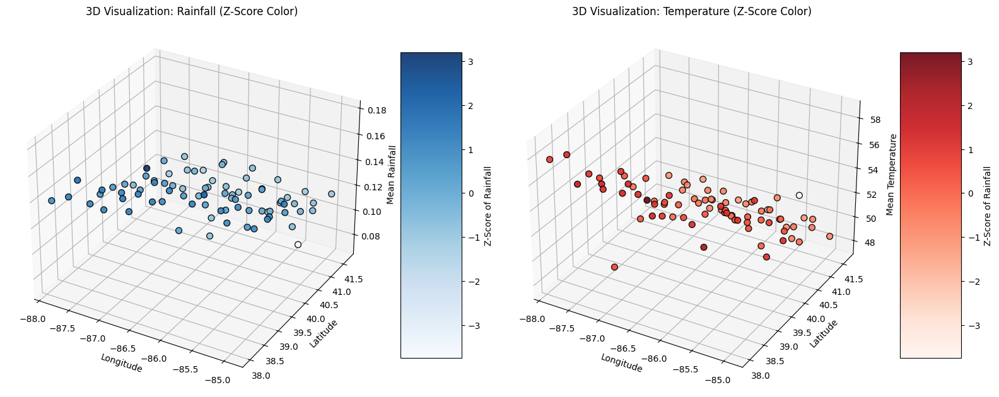

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Ensure centroids are computed for each county
gdf_precip['centroid'] = gdf_precip.geometry.centroid
gdf_precip['longitude'] = gdf_precip['centroid'].x
gdf_precip['latitude'] = gdf_precip['centroid'].y

# Prepare data for 3D plotting
x = gdf_precip['longitude']  # Longitude
y = gdf_precip['latitude']   # Latitude
z_rainfall = gdf_precip['precip_mean']  # Mean Rainfall
z_temp = gdf_precip['meanmeanT']        # Mean Temperature
color = gdf_precip['z_score_precip']    # Z-Score for Rainfall

# Set up the figure for 3D plotting
fig = plt.figure(figsize=(16, 10))

# Plot Rainfall (z_rainfall)
ax1 = fig.add_subplot(121, projection='3d')
sc1 = ax1.scatter(x, y, z_rainfall, c=color, cmap='Blues', s=50, edgecolor='k', alpha=0.9)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_zlabel('Mean Rainfall')
ax1.set_title('3D Visualization: Rainfall (Z-Score Color)')
cbar1 = plt.colorbar(sc1, ax=ax1, shrink=0.5, aspect=5)
cbar1.set_label('Z-Score of Rainfall')

# Plot Temperature (z_temp)
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(x, y, z_temp, c=color, cmap='Reds', s=50, edgecolor='k', alpha=0.9)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_zlabel('Mean Temperature')
ax2.set_title('3D Visualization: Temperature (Z-Score Color)')
cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.5, aspect=5)
cbar2.set_label('Z-Score of Rainfall')

plt.tight_layout()
plt.show()


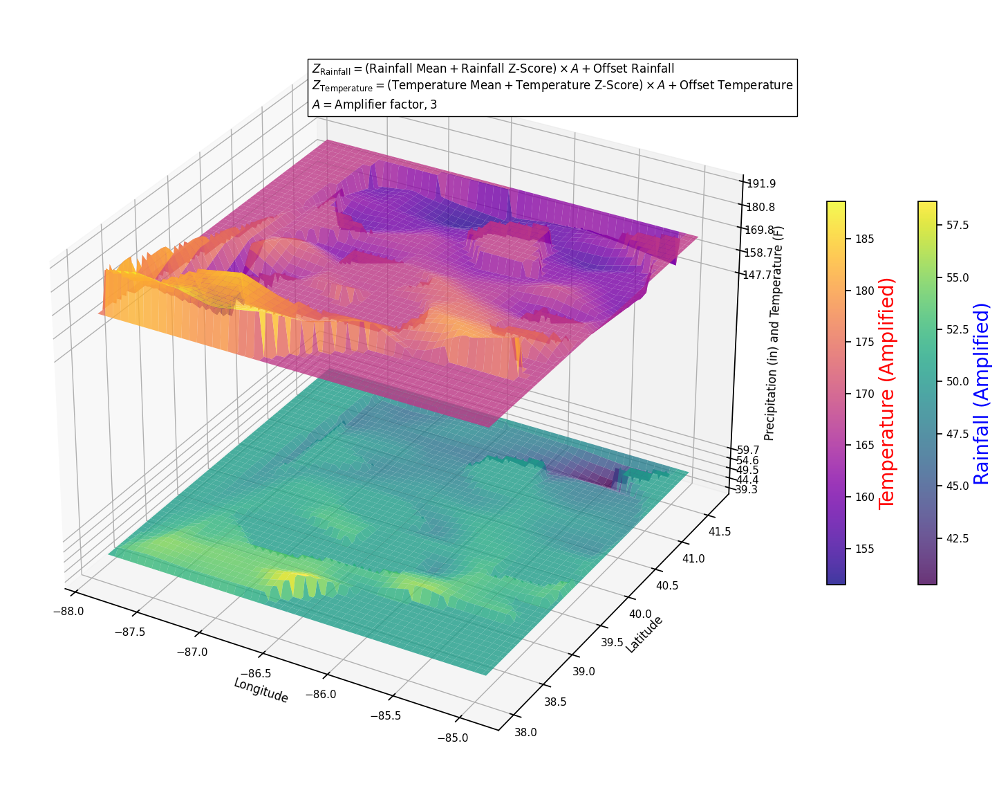

In [131]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata

# Prepare data (replace these with your actual data)
X = gdf_precip['longitude'].values  # Longitude
Y = gdf_precip['latitude'].values   # Latitude
z_rainfall = gdf_precip['precip_mean'].values  # Mean Rainfall
z_temp = gdf_precip['meanmeanT'].values  # Mean Temperature
z_score_rainfall = gdf_precip['z_score_precip'].values  # Z-Score for Rainfall
z_score_temp = gdf_precip['z_score_mean_temp'].values  # Z-Score for Temperature

# Amplify heights and separate surfaces
amplify_factor = 3  # Amplify height for better visibility
offset_temp = 10  # Increase offset to separate Z-axes further
offset_rainfall = 50
z_rain_combined = (z_rainfall + z_score_rainfall) * amplify_factor + offset_rainfall
z_temp_combined = (z_temp + z_score_temp) * amplify_factor + offset_temp

# Create a finer grid for X and Y
X_grid, Y_grid = np.meshgrid(
    np.linspace(X.min(), X.max(), 100),
    np.linspace(Y.min(), Y.max(), 100)
)

# Use linear interpolation to fit Z-values onto the grid
z_rain_grid = griddata((X, Y), z_rain_combined, (X_grid, Y_grid), method='linear')
z_temp_grid = griddata((X, Y), z_temp_combined, (X_grid, Y_grid), method='linear')

# Handle NaN values in the grids
z_rain_grid = np.nan_to_num(z_rain_grid, nan=np.nanmean(z_rain_combined))  # Replace NaNs with the mean value
z_temp_grid = np.nan_to_num(z_temp_grid, nan=np.nanmean(z_temp_combined))  # Replace NaNs with the mean value
sns.set_context("notebook", font_scale=1.0)
# Create 3D plot
fig = plt.figure(figsize=(20, 18))
ax = fig.add_subplot(111, projection="3d")

# Plot Rainfall surface
surf1 = ax.plot_surface(
    X_grid, Y_grid, z_rain_grid, cmap="viridis", edgecolor="none", alpha=0.8
)

# Plot Temperature surface
surf2 = ax.plot_surface(
    X_grid, Y_grid, z_temp_grid, cmap="plasma", edgecolor="none", alpha=0.8
)

# Add Z-axis ticks for both surfaces
z_ticks_rainfall = np.linspace(z_rain_grid.min(), z_rain_grid.max(),  5)
z_ticks_temp = np.linspace(z_temp_grid.min(), z_temp_grid.max(), 5)

# Set Z-ticks for both datasets
ax.set_zticks(np.block([z_ticks_rainfall, z_ticks_temp]))

# Set axis labels
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_zlabel("Precipitation (in) and Temperature (F)")


# Adjust the positions of the colorbars
# Add colorbar for Rainfall
cbar1 = fig.colorbar(
    surf1, ax=ax, pad= -.05, orientation="vertical", shrink=0.4
)
cbar1.set_label("Rainfall (Amplified)", color="blue", fontsize=20)

# Add colorbar for Temperature
cbar2 = fig.colorbar(
    surf2, ax=ax, orientation="vertical", shrink=0.4
)
cbar2.set_label("Temperature (Amplified)", color="red", fontsize=20)


# Add a box with the equations
equation_text = (
    r"$Z_{\text{Rainfall}} = (\text{Rainfall Mean} + \text{Rainfall Z-Score}) \times A + \text{Offset Rainfall}$" "\n"
    r"$Z_{\text{Temperature}} = (\text{Temperature Mean} + \text{Temperature Z-Score}) \times A + \text{Offset Temperature}$" "\n"
    r"$A = \text{Amplifier factor}, $3"
)

# Get the bounds of the plot
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()
z_min, z_max = ax.get_zlim()

# Position the text box within the visible plot
ax.text(
    x_min + (x_max - x_min) * 0.1,  # 10% away from the left edge in the X direction
    y_min + (y_max - y_min) * 0.8,  # 80% up from the bottom in the Y direction
    z_max + (z_max - z_min) * 0.05,  # Slightly above the Z max
    equation_text,
    fontsize=12, color="black",
    bbox=dict(facecolor='white', edgecolor='black', alpha=1)
)


# Display the plot
plt.show()


In [96]:
!pip install pygam

100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08
100% (11 of 11) |########################| Elapsed Time: 0:00:07 Time:  0:00:07
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (11 of 11) |########################| Elapsed Time: 0:00:04 Time:  0:00:04
100% (11 of 11) |#######################

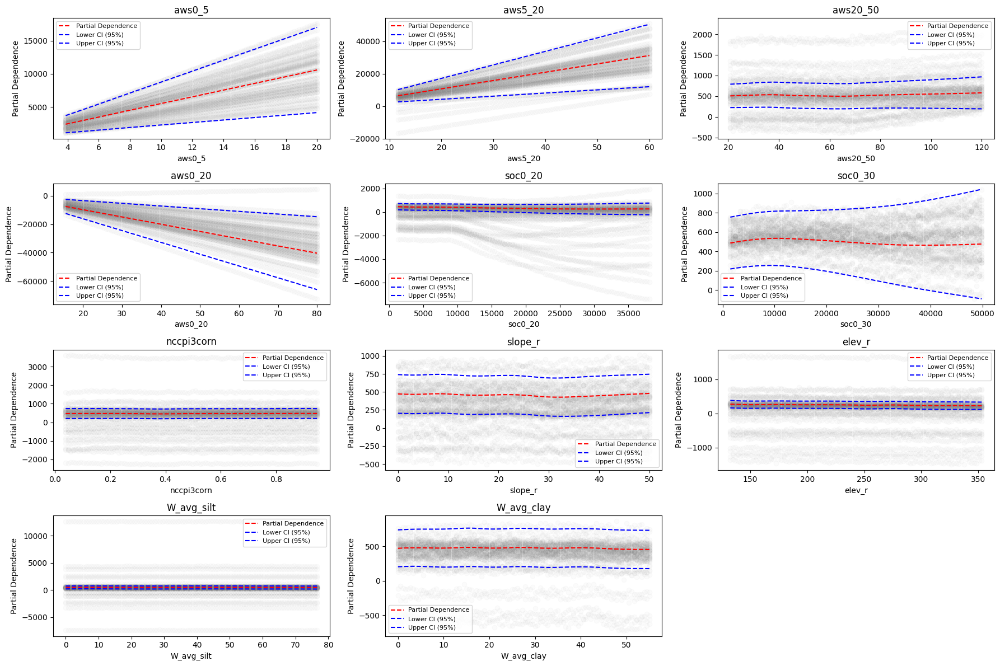

In [104]:
import pandas as pd
from pygam import LinearGAM, s
import matplotlib.pyplot as plt
import numpy as np

# Merge soil data and yield data on 'county'
data = pd.merge(yield_data, soil_data, on='county', how='inner')

# Handle missing data if any
data = data.dropna()

# Define independent variables (soil features) and target variable (yield)
X = data[['aws0_5', 'aws5_20', 'aws20_50', 'aws0_20', 'soc0_20',
          'soc0_30', 'nccpi3corn', 'slope_r', 'elev_r', 'W_avg_silt', 'W_avg_clay']]
y = data['Value']

# Fit a Generalized Additive Model
gam = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) +
                s(5) + s(6) + s(7) + s(8) + s(9) + s(10)).fit(X, y)

# Plot the influence of each soil parameter in a grid layout
n_cols = 3
n_rows = int(np.ceil(len(X.columns) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), sharey=False)

for i, ax in enumerate(axes.flatten()):
    if i < len(X.columns):
        XX = gam.generate_X_grid(term=i)
        # Draw multiple samples from the posterior of the coefficients
        for response in gam.sample(X, y, quantity='y', n_draws=50, sample_at_X=XX):
            ax.scatter(XX[:, i], response, alpha=0.03, color='gray')  # Posterior samples

        # Add partial dependence line
        ax.plot(XX[:, i], gam.predict(XX), 'r--', label='Partial Dependence')

        # Add prediction intervals
        lower, upper = gam.prediction_intervals(XX, width=0.95).T
        ax.plot(XX[:, i], lower, 'b--', label='Lower CI (95%)')
        ax.plot(XX[:, i], upper, 'b--', label='Upper CI (95%)')

        # Add labels and title
        ax.set_title(f'{X.columns[i]}', fontsize=12)
        ax.set_xlabel(f'{X.columns[i]}', fontsize=10)
        ax.set_ylabel('Partial Dependence', fontsize=10)
        ax.legend(loc='best', fontsize=8)
    else:
        # Turn off any empty subplot
        ax.axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [115]:
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     66.8401
Link Function:                     IdentityLink Log Likelihood:                                -14475.8576
Number of Samples:                         1901 AIC:                                            29087.3954
                                                AICc:                                           29092.4933
                                                GCV:                                              863.0659
                                                Scale:                                            808.6203
                                                Pseudo R-Squared:                                   0.1188
Feature Function                  Lam

<ipython-input-115-dec6a6acdaaa>:1: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam.summary()


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    113.3871
Link Function:                     IdentityLink Log Likelihood:                                -10005.8663
Number of Samples:                         1350 AIC:                                            20240.5068
                                                AICc:                                           20261.8881
                                                GCV:                                              776.3326
                                                Scale:                                            659.9211
                                                Pseudo R-Squared:                                   0.2959
Feature Function                  Lam

<ipython-input-117-380c61b62978>:25: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  gam.summary()
100% (11 of 11) |########################| Elapsed Time: 0:00:09 Time:  0:00:09
100% (11 of 11) |########################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (11 of 11) |########################| Elapsed Time: 0:00:08 Time:  0:00:08
100% (11 of 11) |########################| Elapsed Time: 0:00:09 Time:  0:00:09
100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (11 of 11) |########################| Elapsed Time: 0:00:11 Time:  0:00:11
100% (11 of 11) |########################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (11 of 11) |########################| Elapsed Time: 0:00:10 Time:  0:00:10
100% (11 of 11) |########################| Elapsed Time: 0

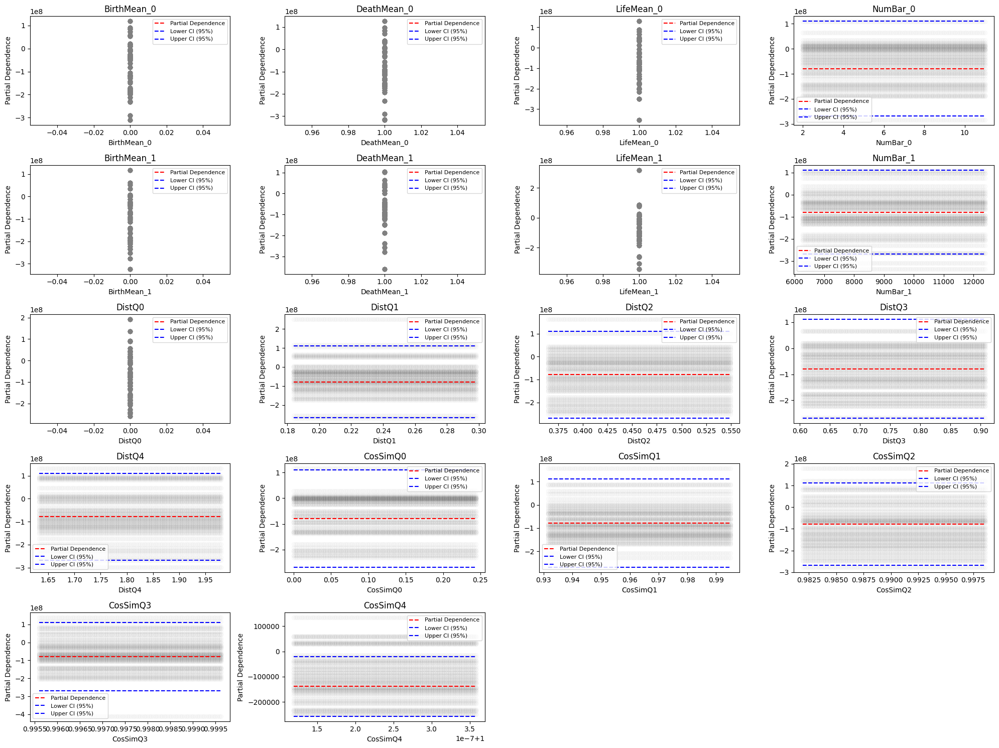

In [117]:
import pandas as pd
from pygam import LinearGAM, s
import matplotlib.pyplot as plt
import numpy as np

# Merge topo features and yield data on 'county'
data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Handle missing data if any
data = data.dropna()

# Define independent variables (topo features) and target variable (yield)
X = data[['BirthMean_0', 'DeathMean_0', 'LifeMean_0', 'NumBar_0',
          'BirthMean_1', 'DeathMean_1', 'LifeMean_1', 'NumBar_1',
          'DistQ0', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
          'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4']]
y = data['Value']

# Fit a Generalized Additive Model
# Dynamically create smooth terms for each feature
gam = LinearGAM(
    sum([s(i) for i in range(len(X.columns))], start=s(0))
).fit(X, y)

gam.summary()

# Plot the influence of each topo parameter in a grid layout
n_cols = 4  # Adjust columns for better spacing
n_rows = int(np.ceil(len(X.columns) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15), sharey=False)

for i, ax in enumerate(axes.flatten()):
    if i < len(X.columns):
        XX = gam.generate_X_grid(term=i)
        # Draw multiple samples from the posterior of the coefficients
        for response in gam.sample(X, y, quantity='y', n_draws=50, sample_at_X=XX):
            ax.scatter(XX[:, i], response, alpha=0.03, color='gray')  # Posterior samples

        # Add partial dependence line
        ax.plot(XX[:, i], gam.predict(XX), 'r--', label='Partial Dependence')

        # Add prediction intervals
        lower, upper = gam.prediction_intervals(XX, width=0.95).T
        ax.plot(XX[:, i], lower, 'b--', label='Lower CI (95%)')
        ax.plot(XX[:, i], upper, 'b--', label='Upper CI (95%)')

        # Add labels and title
        ax.set_title(f'{X.columns[i]}', fontsize=12)
        ax.set_xlabel(f'{X.columns[i]}', fontsize=10)
        ax.set_ylabel('Partial Dependence', fontsize=10)
        ax.legend(loc='best', fontsize=8)
    else:
        # Turn off any empty subplot
        ax.axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


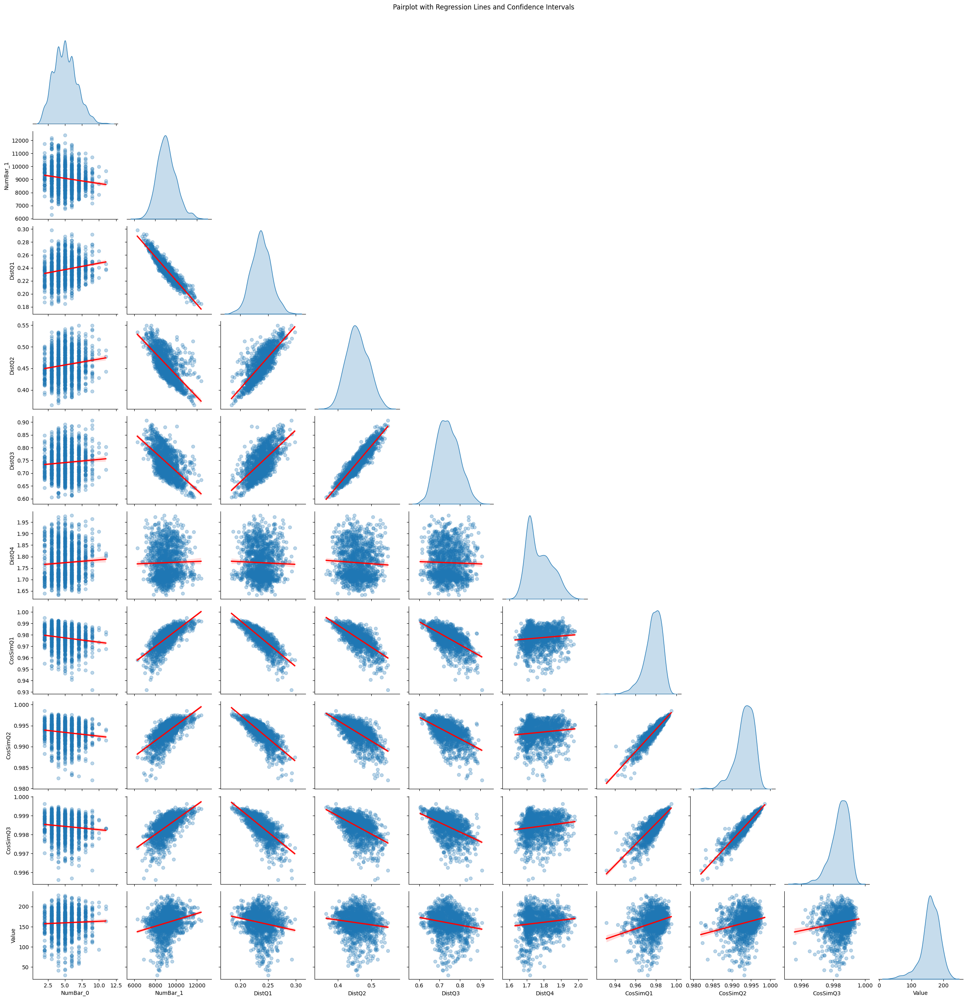

In [122]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Merge topo features and yield data on 'county' and 'year'
data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Handle missing data if any
data = data.dropna()

# Define independent variables (topo features) and target variable (yield)
selected_columns = ['NumBar_0', 'NumBar_1',
                    'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
                    'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'Value']
pairplot_data = data[selected_columns]

# Draw pairplot for the selected features and yield
sns.pairplot(
    pairplot_data,
    kind='reg',  # Adds regression line to the scatter plots
    diag_kind='kde',  # KDE for the diagonal plots
    plot_kws={'scatter_kws': {'alpha': 0.1}, 'line_kws': {'color': 'red'}},
    corner=True  # Only show lower triangle of pairplot to avoid redundancy
)
plt.suptitle("Pairplot with Regression Lines and Confidence Intervals", y=1.02)
plt.show()



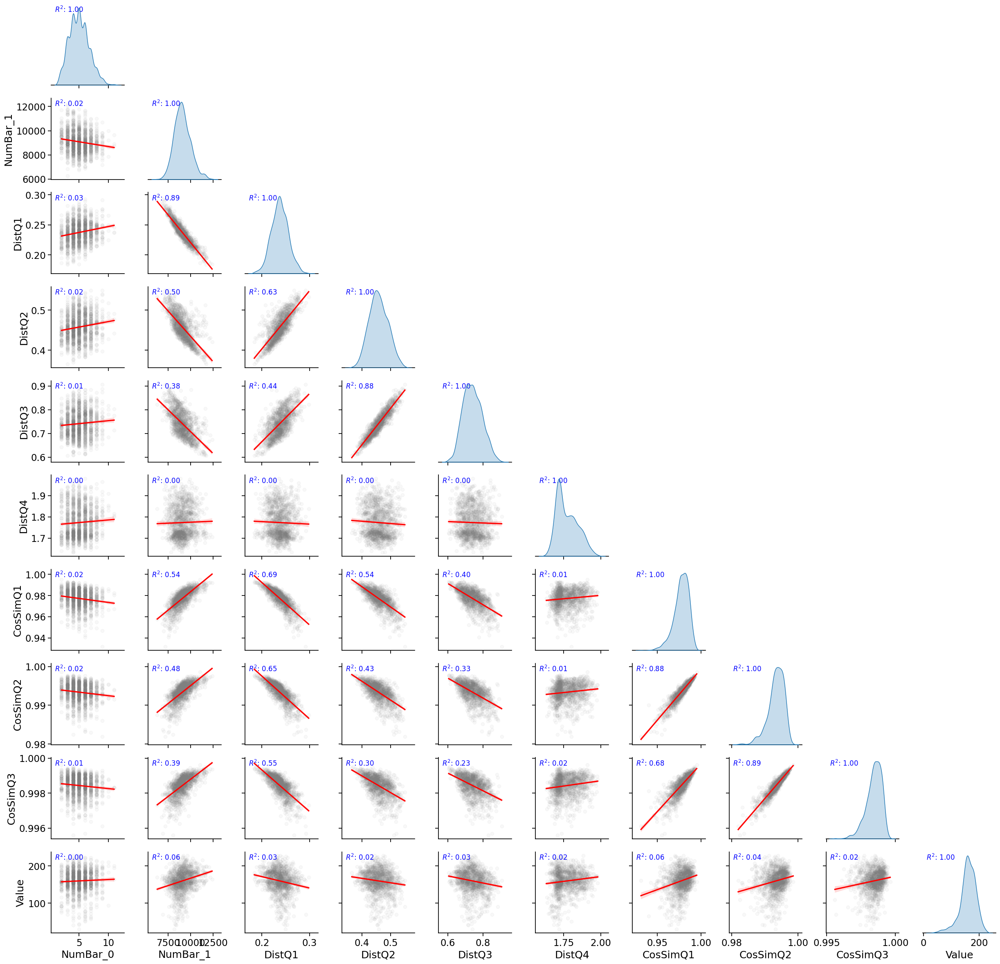

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score

# Custom plotting function to include R² in each plot
def annotate_r2(x, y, **kwargs):
    # Calculate R²
    r2 = r2_score(y, np.polyval(np.polyfit(x, y, 1), x))
    # Add annotation to the plot
    ax = plt.gca()
    ax.text(0.05, 0.9, f"$R^2$: {r2:.2f}", transform=ax.transAxes, fontsize=12, color="blue")

# Set custom font size for axis ticks, labels, and titles in the pairplot
sns.set_context("notebook", font_scale=1.5)  # Adjust the font scale for better readability

# Re-draw pairplot with the adjusted font sizes
sns.pairplot(
    pairplot_data,
    kind="reg",
    diag_kind="kde",
    plot_kws={
        "scatter_kws": {"alpha": 0.05, "color": "gray"},  # Gray scatter points with lower alpha
        "line_kws": {"color": "red"},  # Red regression line
    },
    corner=True,  # Show only the lower triangle
).map(annotate_r2)

# Adjust layout
plt.subplots_adjust(top=0.95)
plt.show()


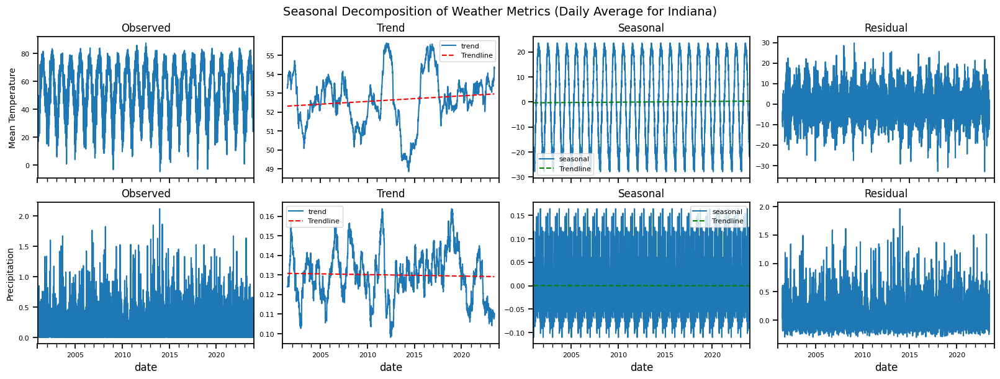

In [142]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import numpy as np

# Ensure 'date' is in datetime format
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Calculate daily averages across all counties in Indiana
indiana_daily_avg = weather_data[['date', 'mergedmean_temp', 'merged_precip']].groupby('date').mean().reset_index()
indiana_daily_avg= indiana_daily_avg.rename(columns={'mergedmean_temp': 'Mean Temperature', 'merged_precip': 'Precipitation'})
# Specify weather metrics to analyze
weather_metrics = ['Mean Temperature', 'Precipitation']

# Perform seasonal decomposition and plot side by side
fig, axes = plt.subplots(len(weather_metrics), 4, figsize=(16, 6), sharex=True, constrained_layout=True)

for idx, metric in enumerate(weather_metrics):
    if metric in indiana_daily_avg.columns:
        # Create a new DataFrame with 'date' set as index for decomposition
        data_for_decomposition = indiana_daily_avg.set_index('date')

        # Perform seasonal decomposition
        decomposition = seasonal_decompose(data_for_decomposition[metric], model='additive', period=365)

        # Observed
        decomposition.observed.plot(ax=axes[idx, 0], title='Observed', fontsize=10)
        axes[idx, 0].set_ylabel(metric, fontsize=10)

        # Trend with a trendline
        decomposition.trend.plot(ax=axes[idx, 1], title='Trend', fontsize=10)
        trend_values = decomposition.trend.dropna()
        trend_x = np.arange(len(trend_values))
        trend_coeffs = np.polyfit(trend_x, trend_values, deg=1)
        trend_line = np.polyval(trend_coeffs, trend_x)
        axes[idx, 1].plot(trend_values.index, trend_line, color='red', linestyle='--', label='Trendline')
        axes[idx, 1].legend(fontsize=8)

        # Seasonality with a trendline
        decomposition.seasonal.plot(ax=axes[idx, 2], title='Seasonal', fontsize=10)
        seasonal_values = decomposition.seasonal
        seasonal_x = np.arange(len(seasonal_values))
        seasonal_coeffs = np.polyfit(seasonal_x, seasonal_values, deg=1)
        seasonal_line = np.polyval(seasonal_coeffs, seasonal_x)
        axes[idx, 2].plot(seasonal_values.index, seasonal_line, color='green', linestyle='--', label='Trendline')
        axes[idx, 2].legend(fontsize=8)

        # Residuals
        decomposition.resid.plot(ax=axes[idx, 3], title='Residual', fontsize=10)

# Adjust text size for axis ticks
for ax_row in axes:
    for ax in ax_row:
        ax.tick_params(axis='both', labelsize=8)

# Add an overall title
fig.suptitle("Seasonal Decomposition of Weather Metrics (Daily Average for Indiana)", fontsize=14)
plt.show()


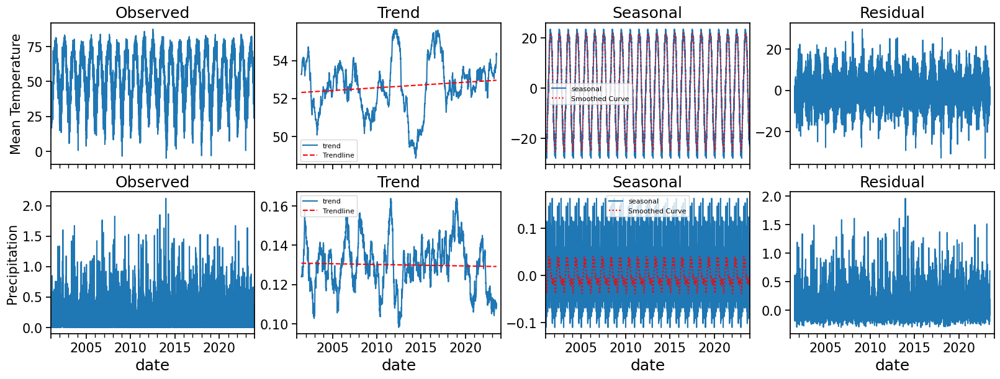

In [152]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import numpy as np
from scipy.ndimage import gaussian_filter1d

# Ensure 'date' is in datetime format
weather_data['date'] = pd.to_datetime(weather_data['date'])

# Calculate daily averages across all counties in Indiana
indiana_daily_avg = weather_data[['date', 'mergedmean_temp', 'merged_precip']].groupby('date').mean().reset_index()

# Specify weather metrics to analyze
weather_metrics = ['mergedmean_temp', 'merged_precip']
sns.set_context("notebook", font_scale=1.5)  # Adjust the font scale for better readability
# Perform seasonal decomposition and plot side by side
fig, axes = plt.subplots(len(weather_metrics), 4, figsize=(16, 6), sharex=True, constrained_layout=True)

for idx, metric in enumerate(weather_metrics):
    if metric in indiana_daily_avg.columns:
        # Create a new DataFrame with 'date' set as index for decomposition
        data_for_decomposition = indiana_daily_avg.set_index('date')

        # Perform seasonal decomposition
        decomposition = seasonal_decompose(data_for_decomposition[metric], model='additive', period=365)

        # Observed
        decomposition.observed.plot(ax=axes[idx, 0], title='Observed', fontsize=15)
        axes[idx, 0].set_ylabel("Mean Temperature" if metric == 'mergedmean_temp' else "Precipitation", fontsize=15)
        axes[idx, 0].set_xlabel("") if idx == 0 else None

        # Trend with a trendline
        decomposition.trend.plot(ax=axes[idx, 1], title='Trend', fontsize=10)
        trend_values = decomposition.trend.dropna()
        trend_x = np.arange(len(trend_values))
        trend_coeffs = np.polyfit(trend_x, trend_values, deg=1)
        trend_line = np.polyval(trend_coeffs, trend_x)
        axes[idx, 1].plot(trend_values.index, trend_line, color='red', linestyle='--', label='Trendline')
        axes[idx, 1].legend(fontsize=8)
        axes[idx, 1].set_ylabel("")
        axes[idx, 1].set_xlabel("") if idx == 0 else None

        # Seasonality with a smoothed curve
        decomposition.seasonal.plot(ax=axes[idx, 2], title='Seasonal', fontsize=10)
        seasonal_values = decomposition.seasonal
        smoothed_seasonal = gaussian_filter1d(seasonal_values, sigma=10)
        axes[idx, 2].plot(seasonal_values.index, smoothed_seasonal, color='red', linestyle='dotted', label='Smoothed Curve')
        axes[idx, 2].legend(fontsize=8)
        axes[idx, 2].set_ylabel("")
        axes[idx, 2].set_xlabel("") if idx == 0 else None

        # Residuals
        decomposition.resid.plot(ax=axes[idx, 3], title='Residual', fontsize=10)
        axes[idx, 3].set_ylabel("")
        axes[idx, 3].set_xlabel("") if idx == 0 else None

# Only keep X-axis labels for the second row
for ax_row in axes[:-1]:
    for ax in ax_row:
        ax.set_xlabel("")

# Adjust text size for axis ticks
for ax_row in axes:
    for ax in ax_row:
        ax.tick_params(axis='both', labelsize=15)

# Add an overall title
# fig.suptitle("Seasonal Decomposition of Weather Metrics (Daily Average for Indiana)")
plt.show()


In [7]:

import pandas as pd
from sklearn.feature_selection import mutual_info_regression
from pygam import LinearGAM, s
# Merge yield_data and topo_features on county and year
data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Extract features and target variable
X = data[['BirthMean_0', 'DeathMean_0', 'LifeMean_0', 'NumBar_0',
          'BirthMean_1', 'DeathMean_1', 'LifeMean_1', 'NumBar_1',
          'DistQ0', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
          'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4']]
y = data['Value']

# Calculate Mutual Information
mi_scores = mutual_info_regression(X, y, random_state=42)
mi_df = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mi_scores})
mi_df.sort_values(by='Mutual Information', ascending=False, inplace=True)

mi_df

# Fit Generalized Additive Model (GAM)
gam = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) +
                s(7) + s(8) + s(9) + s(10) + s(11) + s(12) +
                s(13) + s(14) + s(15) + s(16) + s(17)).fit(X, y)

# Display GAM summary
print(gam.summary())




LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    113.3871
Link Function:                     IdentityLink Log Likelihood:                                -10005.8663
Number of Samples:                         1350 AIC:                                            20240.5068
                                                AICc:                                           20261.8881
                                                GCV:                                              776.3326
                                                Scale:                                            659.9211
                                                Pseudo R-Squared:                                   0.2959
Feature Function                  Lam

<ipython-input-7-8560b19dabe4>:27: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


In [9]:
pip install pygam

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    110.2288
Link Function:                     IdentityLink Log Likelihood:                                 -8028.1421
Number of Samples:                         1080 AIC:                                            16278.7418
                                                AICc:                                           16304.5393
                                                GCV:                                               824.338
                                                Scale:                                            674.4251
                                                Pseudo R-Squared:                                   0.2941
Feature Function                  Lam

<ipython-input-27-7b00f9070544>:29: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


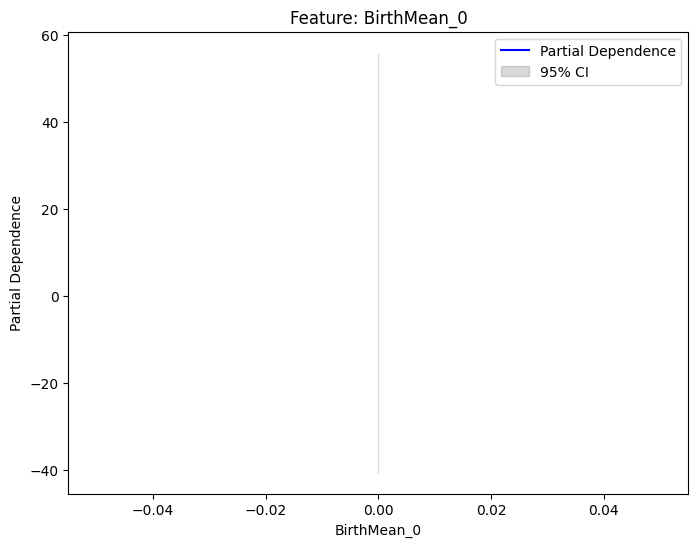

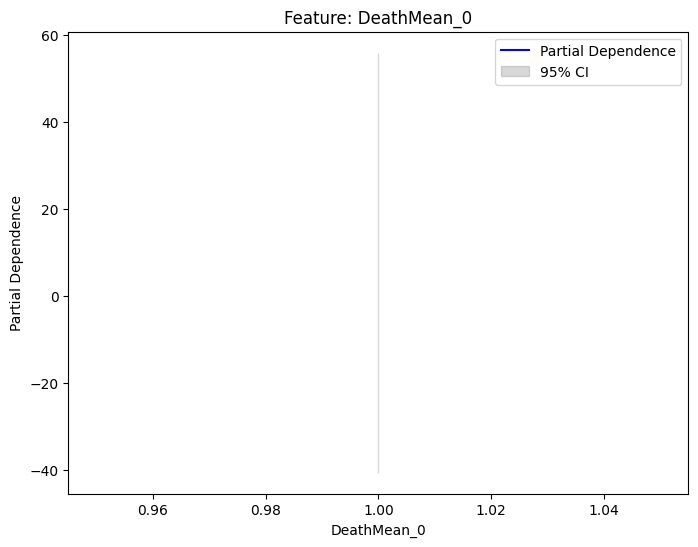

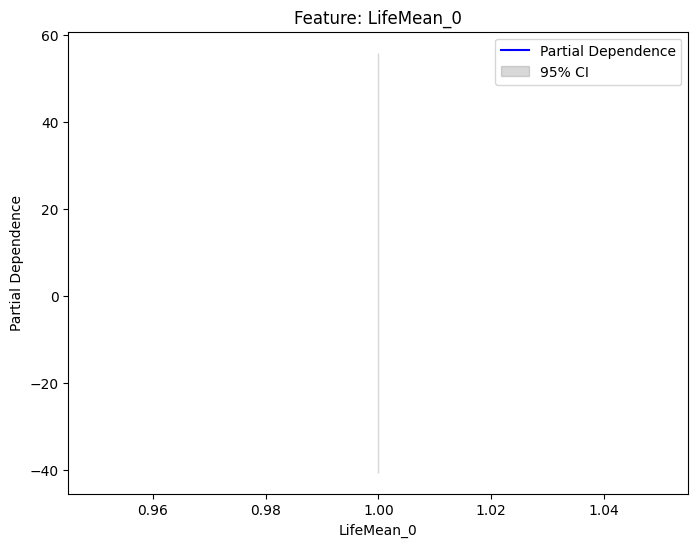

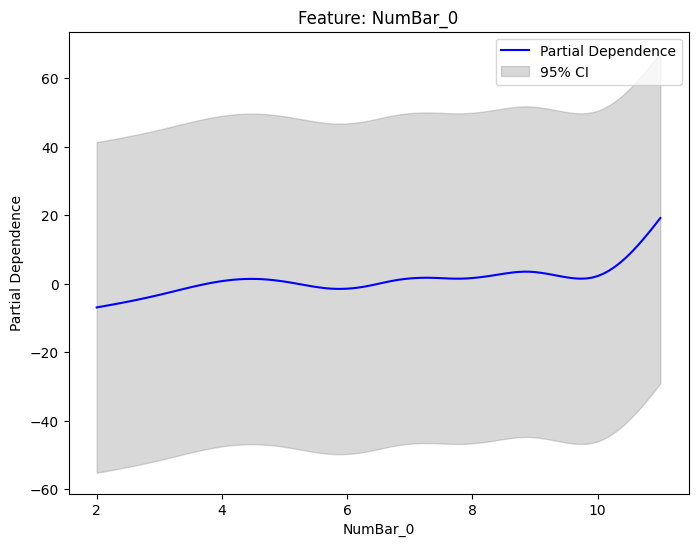

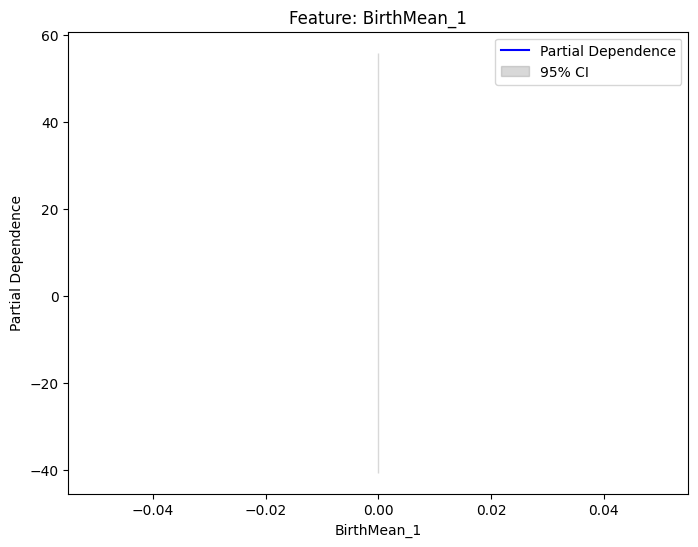

...

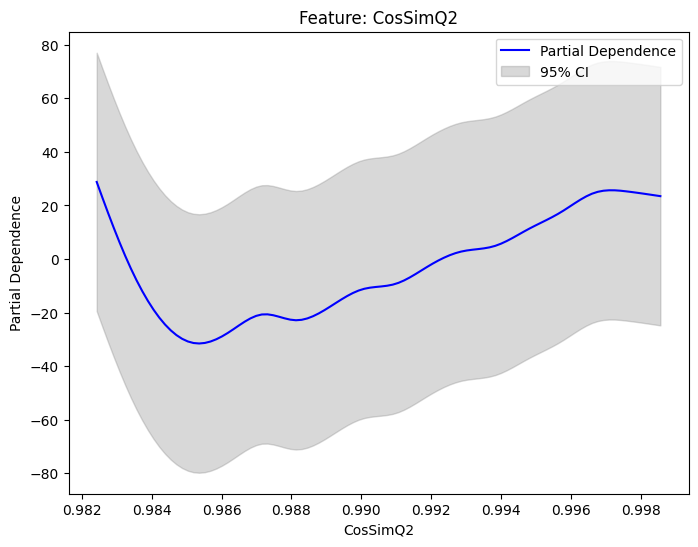

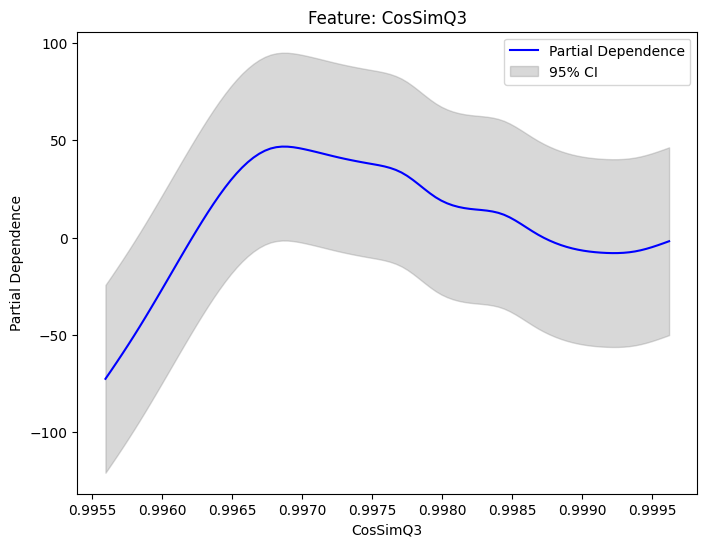

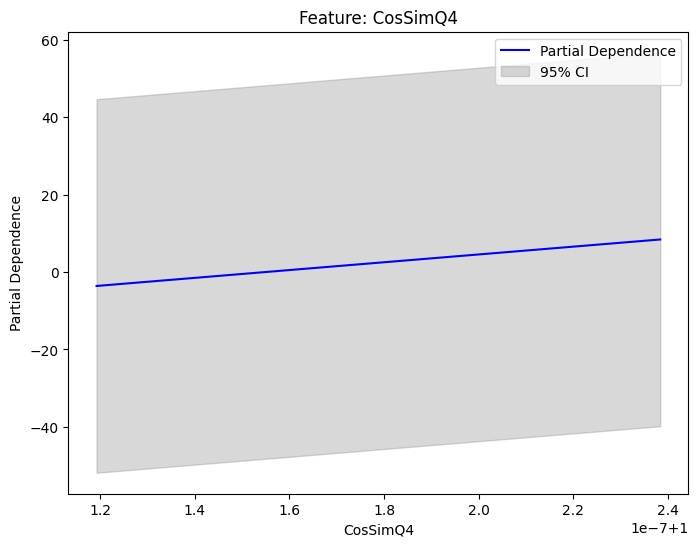

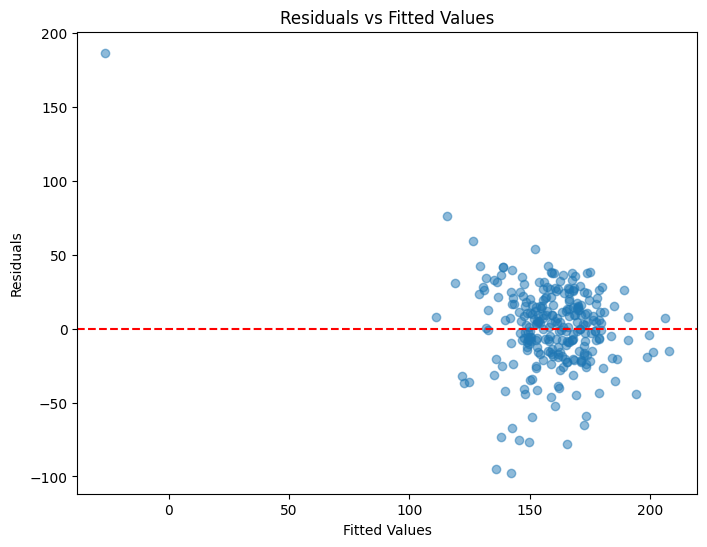

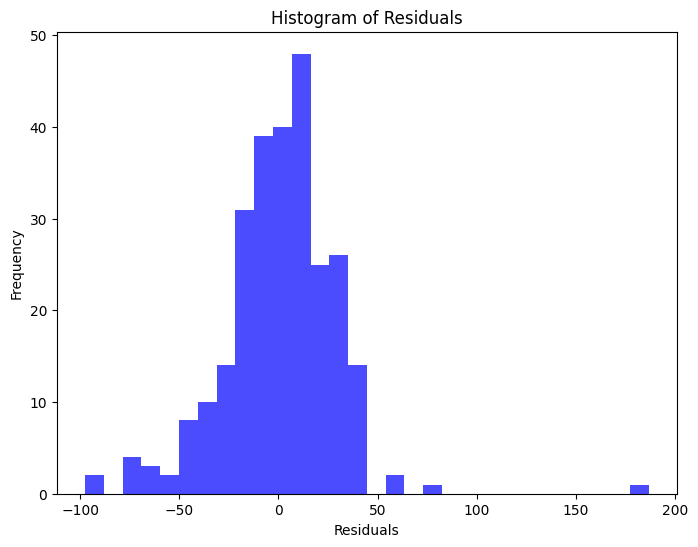

In [27]:
import pandas as pd
from pygam import LinearGAM, s
# from pygam.utils import generate_X_grid
from sklearn.model_selection import train_test_split

data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Extract features and target variable
X = data[['BirthMean_0', 'DeathMean_0', 'LifeMean_0', 'NumBar_0',
          'BirthMean_1', 'DeathMean_1', 'LifeMean_1', 'NumBar_1',
          'DistQ0', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
          'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4']]
y = data['Value']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Generalized Additive Model (GAM) with cubic regression splines
gam = LinearGAM(
    s(0, spline_order=3) + s(1, spline_order=3) + s(2, spline_order=3) +
    s(3, spline_order=3) + s(4, spline_order=3) + s(5, spline_order=3) +
    s(6, spline_order=3) + s(7, spline_order=3) + s(8, spline_order=3) +
    s(9, spline_order=3) + s(10, spline_order=3) + s(11, spline_order=3) +
    s(12, spline_order=3) + s(13, spline_order=3) + s(14, spline_order=3) +
    s(15, spline_order=3) + s(16, spline_order=3) + s(17, spline_order=3)
).fit(X_train, y_train)

# Summary of the fitted model
print(gam.summary())

# Compute residuals
train_residuals = y_train - gam.predict(X_train)
residual_std = train_residuals.std()

# Generate response plots
for i, term in enumerate(gam.terms):
    if term.isintercept:
        continue
    plt.figure(figsize=(8, 6))
    XX = gam.generate_X_grid(term=i)
    partial_dep = gam.partial_dependence(term=i, X=XX)

    plt.plot(XX[:, i], partial_dep, color='blue', label='Partial Dependence')
    plt.fill_between(
        XX[:, i],
        partial_dep - 1.96 * residual_std,
        partial_dep + 1.96 * residual_std,
        color='gray', alpha=0.3, label='95% CI'
    )
    plt.title(f'Feature: {X.columns[i]}')
    plt.xlabel(X.columns[i])
    plt.ylabel('Partial Dependence')
    plt.legend()
    plt.show()

# Perform GAM model check
gam_residuals = y_test - gam.predict(X_test)
plt.figure(figsize=(8, 6))
plt.scatter(gam.predict(X_test), gam_residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(gam_residuals, bins=30, alpha=0.7, color='blue')
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    110.2288
Link Function:                     IdentityLink Log Likelihood:                                 -8028.1421
Number of Samples:                         1080 AIC:                                            16278.7418
                                                AICc:                                           16304.5393
                                                GCV:                                               824.338
                                                Scale:                                            674.4251
                                                Pseudo R-Squared:                                   0.2941
Feature Function                  Lam

<ipython-input-29-326e0b0a9941>:30: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


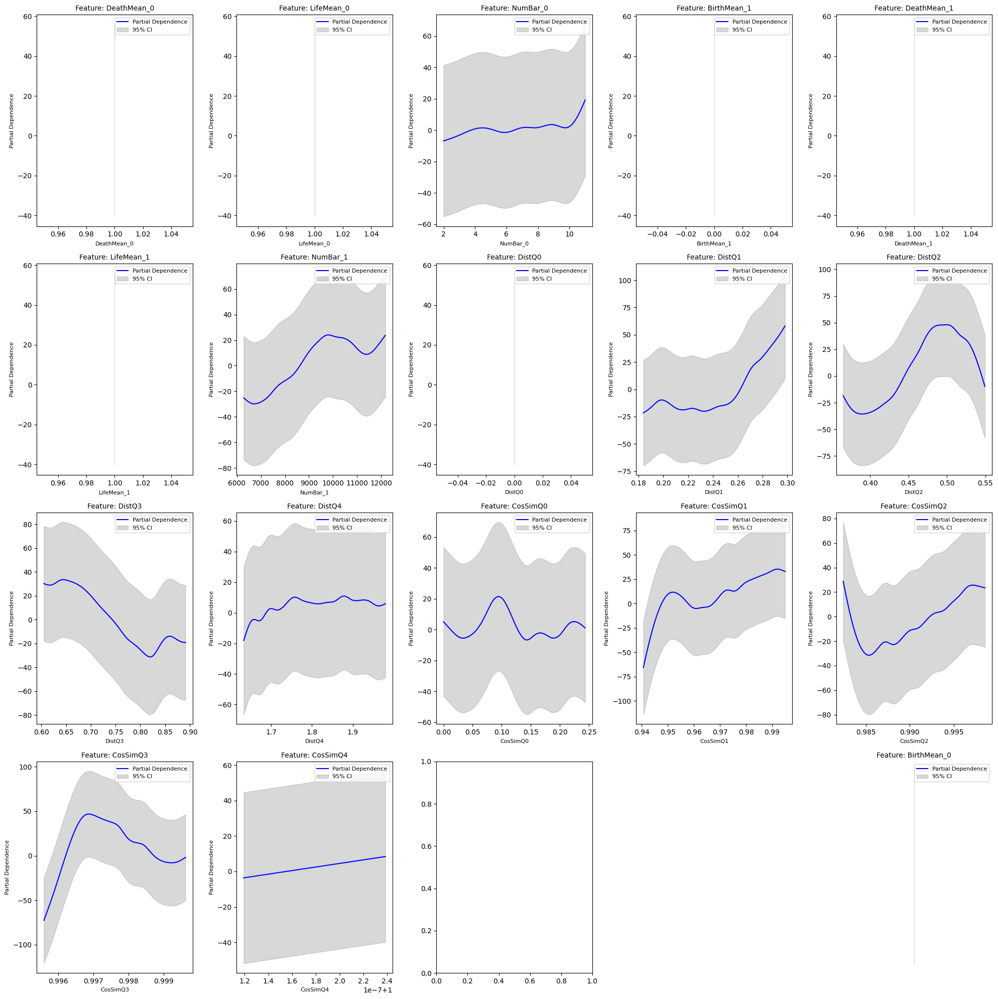

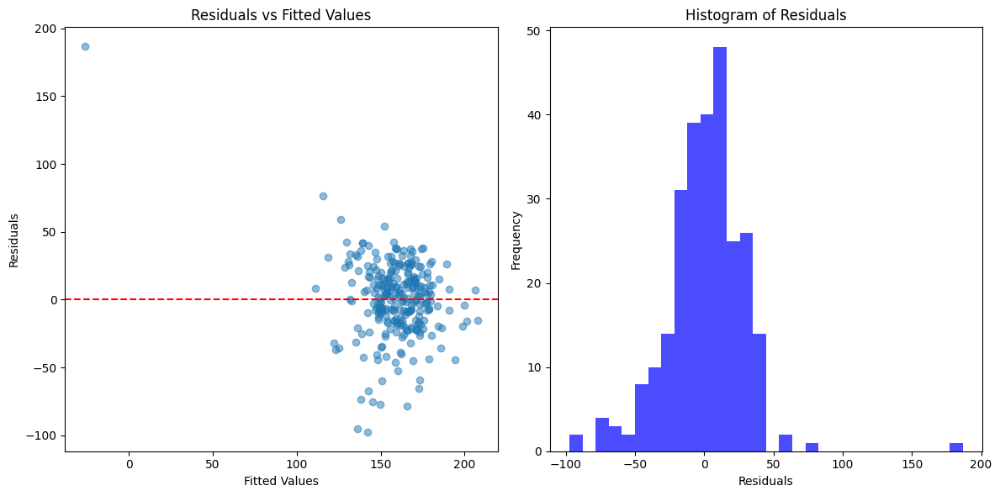

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from pygam import LinearGAM, s
from sklearn.model_selection import train_test_split

# Merge the datasets
data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Extract features and target variable
X = data[['BirthMean_0', 'DeathMean_0', 'LifeMean_0', 'NumBar_0',
          'BirthMean_1', 'DeathMean_1', 'LifeMean_1', 'NumBar_1',
          'DistQ0', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
          'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4']]
y = data['Value']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Generalized Additive Model (GAM) with cubic regression splines
gam = LinearGAM(
    s(0, spline_order=3) + s(1, spline_order=3) + s(2, spline_order=3) +
    s(3, spline_order=3) + s(4, spline_order=3) + s(5, spline_order=3) +
    s(6, spline_order=3) + s(7, spline_order=3) + s(8, spline_order=3) +
    s(9, spline_order=3) + s(10, spline_order=3) + s(11, spline_order=3) +
    s(12, spline_order=3) + s(13, spline_order=3) + s(14, spline_order=3) +
    s(15, spline_order=3) + s(16, spline_order=3) + s(17, spline_order=3)
).fit(X_train, y_train)

# Summary of the fitted model
print(gam.summary())

# Compute residuals
train_residuals = y_train - gam.predict(X_train)
residual_std = train_residuals.std()

# Generate response plots in a grid layout
n_cols = 5  # Number of columns in the grid
n_rows = (len(X.columns) + n_cols - 1) // n_cols  # Calculate required rows
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5), sharey=False)
axes = axes.flatten()

for i, term in enumerate(gam.terms):
    if term.isintercept:
        continue
    ax = axes[i - 1]
    XX = gam.generate_X_grid(term=i)
    partial_dep = gam.partial_dependence(term=i, X=XX)

    ax.plot(XX[:, i], partial_dep, color='blue', label='Partial Dependence')
    ax.fill_between(
        XX[:, i],
        partial_dep - 1.96 * residual_std,
        partial_dep + 1.96 * residual_std,
        color='gray', alpha=0.3, label='95% CI'
    )
    ax.set_title(f'Feature: {X.columns[i]}', fontsize=10)
    ax.set_xlabel(X.columns[i], fontsize=8)
    ax.set_ylabel('Partial Dependence', fontsize=8)
    ax.legend(fontsize=8)

# Hide unused subplots
for ax in axes[len(X.columns):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Perform GAM model check
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Residuals vs Fitted Values
axes[0].scatter(gam.predict(X_test), gam_residuals, alpha=0.5)
axes[0].axhline(0, color='red', linestyle='--')
axes[0].set_title('Residuals vs Fitted Values')
axes[0].set_xlabel('Fitted Values')
axes[0].set_ylabel('Residuals')

# Histogram of Residuals
axes[1].hist(gam_residuals, bins=30, alpha=0.7, color='blue')
axes[1].set_title('Histogram of Residuals')
axes[1].set_xlabel('Residuals')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                    110.2288
Link Function:                     IdentityLink Log Likelihood:                                 -8028.1421
Number of Samples:                         1080 AIC:                                            16278.7418
                                                AICc:                                           16304.5393
                                                GCV:                                               824.338
                                                Scale:                                            674.4251
                                                Pseudo R-Squared:                                   0.2941
Feature Function                  Lam

<ipython-input-45-b1e1d80c418c>:27: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


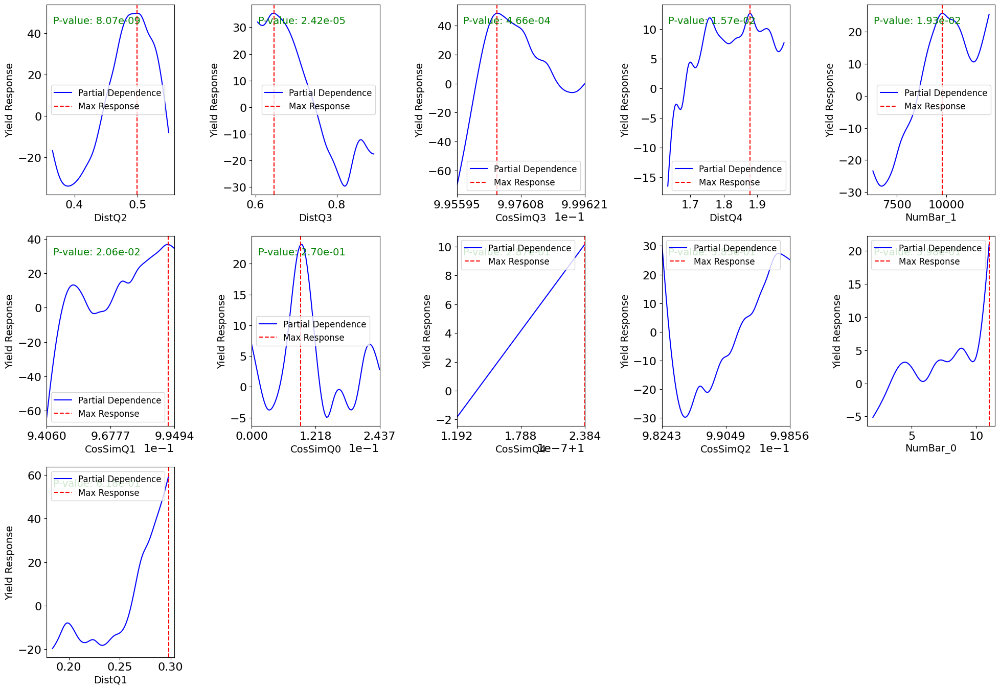

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from pygam import LinearGAM, s
from sklearn.model_selection import train_test_split
import numpy as np
plt.rcParams.update({'font.size': 16})
# Merge the datasets
data = pd.merge(yield_data, topo_features, on=['county', 'year'], how='inner')

# Extract features and target variable
X = data[['NumBar_0', 'NumBar_1', 'DistQ1', 'DistQ2', 'DistQ3', 'DistQ4',
          'CosSimQ0', 'CosSimQ1', 'CosSimQ2', 'CosSimQ3', 'CosSimQ4']]
y = data['Value']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the Generalized Additive Model (GAM) with cubic regression splines
gam = LinearGAM(
    s(0, spline_order=3) + s(1, spline_order=3) + s(2, spline_order=3) +
    s(3, spline_order=3) + s(4, spline_order=3) + s(5, spline_order=3) +
    s(6, spline_order=3) + s(7, spline_order=3) + s(8, spline_order=3) +
    s(9, spline_order=3) + s(10, spline_order=3)
).fit(X_train, y_train)

# Summary of the fitted model
print(gam.summary())

# Extract p-values and feature names
p_values = gam.statistics_['p_values']
features = X.columns

# Create a DataFrame to hold feature names and their corresponding p-values
significance_df = pd.DataFrame({
    'Feature': features,
    'P-value': p_values[:-1]  # Exclude intercept
})

# Sort the DataFrame by P-values
significance_df = significance_df.sort_values(by='P-value')

# Generate response plots in a grid layout based on sorted significance
n_cols = 5  # Number of columns in the grid
n_rows = (len(features) + n_cols - 1) // n_cols  # Calculate required rows
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5), sharey=False)
axes = axes.flatten()

for idx, (feature, ax) in enumerate(zip(significance_df['Feature'], axes)):
    feature_idx = X.columns.get_loc(feature)
    XX = gam.generate_X_grid(term=feature_idx)
    partial_dep = gam.partial_dependence(term=feature_idx, X=XX)

    # Apply specific fix for problematic features
    if feature.startswith('CosSimQ'):
        ax.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
        ax.set_xlim(min(XX[:, feature_idx]), max(XX[:, feature_idx]))
        ax.set_xticks(np.linspace(min(XX[:, feature_idx]), max(XX[:, feature_idx]), num=3))

    # Plot the partial dependence
    ax.plot(XX[:, feature_idx], partial_dep, color='blue', label='Partial Dependence')

    # Highlight the max response point
    max_yield_idx = np.argmax(partial_dep)
    ax.axvline(XX[max_yield_idx, feature_idx], color='red', linestyle='--', label='Max Response')

    # Add P-value to the plot
    p_value = significance_df.loc[significance_df['Feature'] == feature, 'P-value'].values[0]
    ax.text(0.05, 0.9, f"P-value: {p_value:.2e}", transform=ax.transAxes, fontsize=14, color="green")

    ax.set_xlabel(feature, fontsize=14)
    ax.set_ylabel("Yield Response", fontsize=14)
    ax.legend(fontsize=12)




# Hide unused subplots
for ax in axes[len(features):]:
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.suptitle("Dependency Plots Sorted by Feature Significance", fontsize=16)
plt.show()


In [47]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from scipy.interpolate import griddata
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Load data
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'}).to_crs(epsg=26916)  # Reproject to NAD83 / UTM zone 16N
counties['centroid'] = counties.geometry.centroid
counties['longitude'] = counties['centroid'].x
counties['latitude'] = counties['centroid'].y

yield_data = pd.read_csv('/content/drive/MyDrive/yield_classification/corn2001_2023_yield_data.csv')
yield_data = yield_data[['Year', 'County', 'Value']].rename(columns={'County': 'county', 'Year': 'year'})

# Clean data
yield_data = yield_data[~(yield_data['county'] == 'OTHER (COMBINED) COUNTIES')]

# Merge data
merged = pd.merge(yield_data, counties[['county', 'longitude', 'latitude']], on='county', how='inner')


<ipython-input-52-07ec425609db>:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['longitude'] = counties.geometry.centroid.x
<ipython-input-52-07ec425609db>:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  counties['latitude'] = counties.geometry.centroid.y
<ipython-input-52-07ec425609db>:44: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  indiana_boundary = counties.unary_union


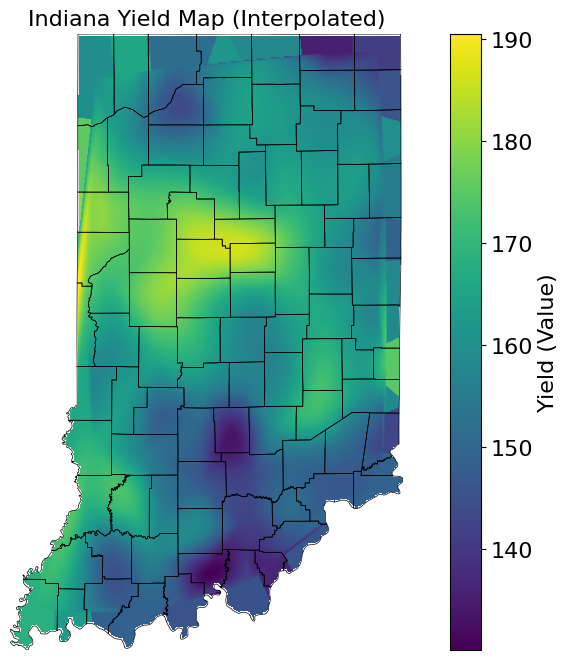

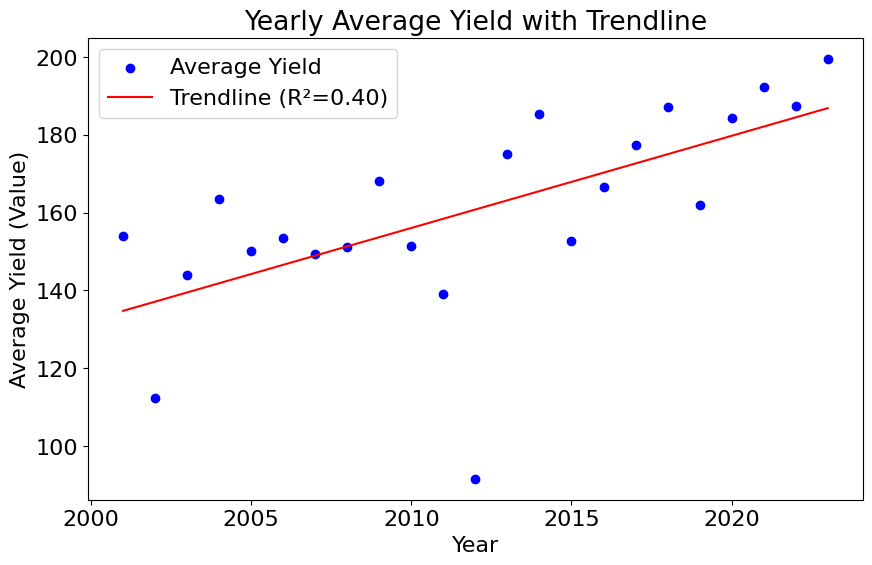

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import geopandas as gpd
from shapely.geometry import Point

# Step 1: Load shapefile and yield data
counties = gpd.read_file('/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp')
counties = counties.rename(columns={'NAME_U': 'county'})
counties = counties.to_crs('EPSG:4326')  # Convert CRS to latitude/longitude

# Generate centroid coordinates
counties['longitude'] = counties.geometry.centroid.x
counties['latitude'] = counties.geometry.centroid.y

# Step 2: Prepare yield data
yield_data = yield_soil[['Year', 'County', 'Value']].rename(columns={'County': 'county', 'Year': 'year'})
merged_data = pd.merge(
    counties[['county', 'longitude', 'latitude']],
    yield_data.groupby('county')['Value'].mean().reset_index(),
    on='county',
    how='inner'
)

# Step 3: Interpolation
longitude = merged_data['longitude'].values
latitude = merged_data['latitude'].values
yield_values = merged_data['Value'].values

# Create a grid for interpolation
lon_grid = np.linspace(counties.total_bounds[0], counties.total_bounds[2], 500)
lat_grid = np.linspace(counties.total_bounds[1], counties.total_bounds[3], 500)
lon_grid, lat_grid = np.meshgrid(lon_grid, lat_grid)

# Interpolate yield data onto the grid
yield_grid = griddata((longitude, latitude), yield_values, (lon_grid, lat_grid), method='cubic')

# Fill NaN values in the grid
yield_grid[np.isnan(yield_grid)] = griddata((longitude, latitude), yield_values,
                                            (lon_grid, lat_grid), method='nearest')[np.isnan(yield_grid)]

# Step 4: Mask grid to Indiana boundary
indiana_boundary = counties.unary_union
indiana_mask = np.zeros(yield_grid.shape, dtype=bool)
for i in range(lon_grid.shape[0]):
    for j in range(lat_grid.shape[1]):
        point = Point(lon_grid[i, j], lat_grid[i, j])
        if indiana_boundary.contains(point):
            indiana_mask[i, j] = True

yield_grid[~indiana_mask] = np.nan

# Step 5: Plot interpolated yield map
plt.figure(figsize=(12, 8))
plt.imshow(yield_grid, extent=(counties.total_bounds[0], counties.total_bounds[2],
                               counties.total_bounds[1], counties.total_bounds[3]),
           origin='lower', cmap='viridis')
counties.boundary.plot(ax=plt.gca(), color="black", linewidth=0.5)
plt.colorbar(label='Yield (Value)')
plt.title('Indiana Yield Map (Interpolated)', fontsize=16)
plt.axis('off')
plt.show()

# Step 6: Yearly Average Yield Scatter Plot
yearly_avg_yield = yield_data.groupby('year')['Value'].mean().reset_index()

# Scatter plot with trendline
plt.figure(figsize=(10, 6))
plt.scatter(yearly_avg_yield['year'], yearly_avg_yield['Value'], color='blue', label='Average Yield')
z = np.polyfit(yearly_avg_yield['year'], yearly_avg_yield['Value'], 1)
p = np.poly1d(z)
plt.plot(yearly_avg_yield['year'], p(yearly_avg_yield['year']), color='red', label=f'Trendline (R²={np.corrcoef(yearly_avg_yield["Value"], p(yearly_avg_yield["year"]))[0, 1]**2:.2f})')
plt.xlabel('Year')
plt.ylabel('Average Yield (Value)')
plt.title('Yearly Average Yield with Trendline')
plt.legend()
plt.show()


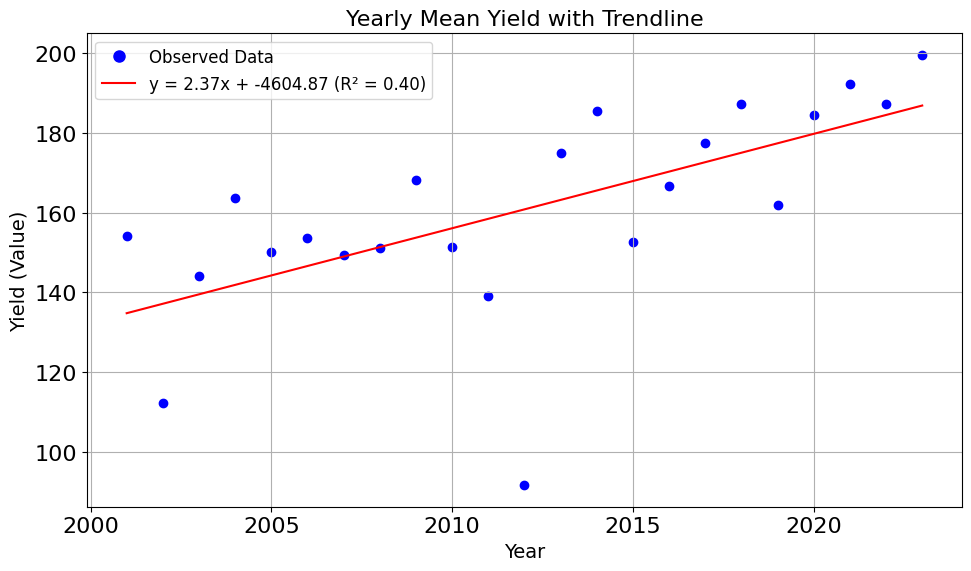

In [54]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress
import pandas as pd

# Example data preparation (replace with your actual data)
# yield_data = pd.read_csv("path_to_yield_data.csv")
yearly_mean = yield_data.groupby('year')['Value'].mean().reset_index()

# Linear regression
x = yearly_mean['year'].values.reshape(-1, 1)
y = yearly_mean['Value'].values
model = LinearRegression()
model.fit(x, y)
trendline = model.predict(x)
r2 = model.score(x, y)

# Calculate slope and intercept for the equation
slope, intercept, r_value, p_value, std_err = linregress(yearly_mean['year'], yearly_mean['Value'])
equation = f"y = {slope:.2f}x + {intercept:.2f} (R² = {r2:.2f})"

# Plot scatterplot
plt.figure(figsize=(10, 6))
plt.scatter(yearly_mean['year'], yearly_mean['Value'], color='blue', label='Observed Data')
plt.plot(yearly_mean['year'], trendline, color='red')

# Labels and title
plt.xlabel('Year', fontsize=14)
plt.ylabel('Yield (Value)', fontsize=14)
plt.title('Yearly Mean Yield with Trendline', fontsize=16)

# Add a combined legend
plt.legend([plt.Line2D([0], [0], color='blue', marker='o', linestyle='', markersize=8),
            plt.Line2D([0], [0], color='red')],
           ['Observed Data', equation],
           fontsize=12)

plt.grid()
plt.tight_layout()
plt.show()
